In [30]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [31]:
#part1
import os
import sys
import gc
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
import torch

main_folder = "../.."
sys.path.insert(0, os.path.join(main_folder))

from src.config import EXP_CONFIGS
from src.inference_feedback import (
    extract_aux_oof_to_csv,
    sweep_thresholds, uncertainty_band, assign_reliability,
    load_model,
    run_batch,
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

TARGET     = "Pawpularity"
IMG_FOLDER = os.path.join(main_folder, "data", "train")
CSV_PATH   = os.path.join(main_folder, "data", "train.csv")
df         = pd.read_csv(CSV_PATH)
AUX_TASKS  = ["Eyes","Face","Occlusion", "Blur",
                             "Subject Focus","Action","Accessory",
                             "Near", "Group","Collage","Human", "Info"]
SWIN_GRID  = (12, 12)

# exp19: standard BCE aux heads
out_dir_exp19 = os.path.join(main_folder, "outputs", "extra",
                             "exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion")

cfg_exp19 = EXP_CONFIGS["exp15_aux_brisque"].copy()
cfg_exp19["img_size"] = 384
cfg_exp19["name"] = "exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion"
cfg_exp19["loss"] = "mse"
cfg_exp19["head_type"] = "mlp"
cfg_exp19["aux_tasks"] = []
cfg_exp19["binary_aux_tasks"]   = ["Eyes","Face","Occlusion", "Blur",
                             "Subject Focus","Action","Accessory",
                             "Near", "Group","Collage","Human", "Info"]  # all 12 binary aux tasks
cfg_exp19["aux_loss_weights"]   = {
    "Face":      0.1,
    "Eyes":      0.1,
    "Occlusion": 0.1,
    "Blur":      0.1,
    "Subject Focus": 0.1,
    "Action": 0.1,
    "Accessory": 0.1,
    "Group": 0.1,
    "Collage": 0.1,
    "Human": 0.1,
    "Info": 0.1,
    "Near": 0.1
}
cfg_exp19["use_saliency"] = False

ACTIVE_CFG = cfg_exp19
ACTIVE_DIR = out_dir_exp19


Device: cuda


In [32]:
#part2
# To create the aux head with the probabilities for each record and each aux head and save it to a CSV file
aux_df = extract_aux_oof_to_csv(
    out_dir=ACTIVE_DIR,
    df=df,
    img_folder=IMG_FOLDER,
    cfg=ACTIVE_CFG,
    device=device,
)

Loading existing: ../../outputs/extra/exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion/oof_detail_aux.csv


In [33]:
#part3
aux_df.head()

,Id,fold,ytrue,Eyes_true,Eyes_prob,Eyes_pred_05,Face_true,Face_prob,Face_pred_05,Occlusion_true,...,Group_pred_05,Collage_true,Collage_prob,Collage_pred_05,Human_true,Human_prob,Human_pred_05,Info_true,Info_prob,Info_pred_05
0,0007de18844b0dbbb5e1f607da0606e0,1,63.0,1,0.800557,1,1,0.923141,1,0,...,0,0,0.067400,0,0,0.272856,0,0,0.081145,0
1,0018df346ac9c1d8413cfcc888ca8246,1,15.0,1,0.735342,1,1,0.900173,1,0,...,0,0,0.045323,0,0,0.210455,0,0,0.062315,0
2,0042bc5bada6d1cf8951f8f9f0d399fa,1,53.0,1,0.750277,1,1,0.911344,1,0,...,0,0,0.042449,0,0,0.157305,0,0,0.058219,0
3,005017716086b8d5e118dd9fe26459b1,1,28.0,1,0.858519,1,1,0.952724,1,0,...,0,0,0.030480,0,0,0.152466,0,0,0.044842,0
4,00630b1262efe301cb15a3b2022ba744,1,18.0,1,0.771668,1,1,0.912375,1,0,...,0,0,0.039415,0,0,0.117797,0,0,0.047521,0


Raw OOF calibration summary for all 12 auxiliary heads:


,task,n,n_positive,n_negative,positive_rate,raw_prob_min,raw_prob_max,raw_brier,raw_ece
0,Eyes,9912,7658,2254,0.7726,0.3084,0.9246,0.1577,0.0683
1,Near,9912,8540,1372,0.8616,0.2667,0.9805,0.1019,0.0641
2,Face,9912,8960,952,0.9040,0.5008,0.9733,0.0785,0.0559
3,Occlusion,9912,1705,8207,0.1720,0.0638,0.4775,0.1279,0.0557
4,Human,9912,1648,8264,0.1663,0.0513,0.5021,0.1228,0.0472
5,Group,9912,1282,8630,0.1293,0.0403,0.6485,0.1015,0.0450
6,Info,9912,607,9305,0.0612,0.0222,0.3674,0.0538,0.0232
7,Accessory,9912,672,9240,0.0678,0.0327,0.1572,0.0620,0.0143
8,Blur,9912,698,9214,0.0704,0.0287,0.1250,0.0651,0.0092
9,Collage,9912,492,9420,0.0496,0.0181,0.2523,0.0444,0.0088


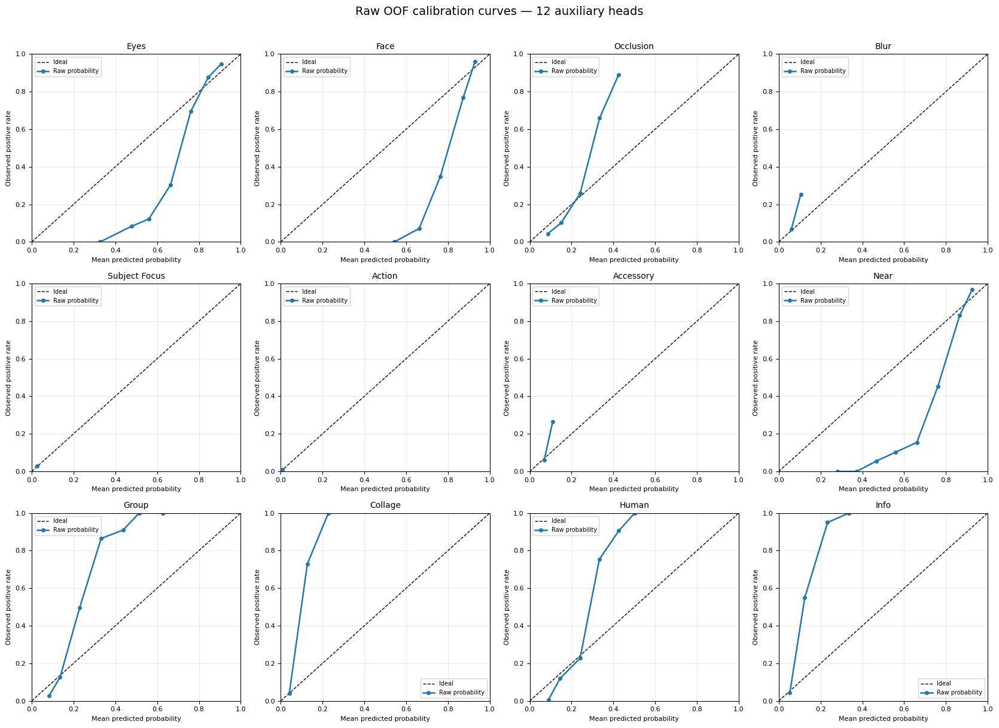

In [34]:
# =====================part4=======================================
# SECTION 2 — STEP 2A: Raw probability calibration diagnosis
#
#  
# "Evaluate the calibration status of each label using:
#  1. Calibration curve
#  2. Brier score
#  3. Expected Calibration Error (ECE)"
#
# Uses:
# - all 12 auxiliary heads
# - all pooled OOF records
# 
#
# ============================================================

from src.aux_calibration import (
    diagnose_raw_oof_calibration,
    plot_calibration_curves,
)

# All 12 heads are analysed first.
# We will decide later which labels are usable for user-facing feedback.
CALIBRATION_TASKS = AUX_TASKS.copy()

raw_calibration_summary, raw_bin_tables = (
    diagnose_raw_oof_calibration(
        aux_df=aux_df,
        aux_tasks=CALIBRATION_TASKS,
        n_bins=10,
    )
)

# Sort worst-to-best by raw ECE only for inspection.
# This is not a final decision rule because ECE can be unstable for
# extremely rare labels; the calibration curve and Brier score matter too.
raw_calibration_summary = raw_calibration_summary.sort_values(
    "raw_ece",
    ascending=False,
).reset_index(drop=True)

print("Raw OOF calibration summary for all 12 auxiliary heads:")
display(raw_calibration_summary.round(4))

plot_calibration_curves(
    bin_tables=raw_bin_tables,
    aux_tasks=CALIBRATION_TASKS,
    title="Raw OOF calibration curves — 12 auxiliary heads",
    n_cols=4,
    method_label="Raw probability",
)

The raw reliability diagrams show that the auxiliary-head probabilities are not uniformly calibrated: some labels overestimate the positive rate while others underestimate it.

Each plotted point represents a probability bin with mean predicted probability on the x-axis and observed positive rate on the y-axis; perfect calibration lies on the dashed diagonal line.

In [35]:
# ===================== part 5 =====================================
# SECTION 2 — STEP 2B
# Split-aware calibration method selection
#
# Folds 1,2,3:
#   - choose raw / Platt / isotonic per auxiliary head
#   - produce cross-fitted selected probabilities for threshold search
#
# Folds 4,5:
#   - do NOT influence method selection
#   - receive probabilities from calibrators fitted only on folds 1,2,3
#
# No selective thresholds are chosen in this part.
# ================================================================

from src.aux_calibration import (
    crossfit_calibration_all_tasks,
    select_calibration_methods_all_tasks,
    fit_platt_calibrator,
    fit_isotonic_calibrator,
    apply_calibrator,
)

# ------------------------------------------------------------
# 0. Define the selection/evaluation split BEFORE method choice
# ------------------------------------------------------------

THRESHOLD_SELECTION_FOLDS = [1, 2, 3]
THRESHOLD_EVALUATION_FOLDS = [4, 5]

calibration_selection_aux_df = aux_df[
    aux_df["fold"].isin(THRESHOLD_SELECTION_FOLDS)
].copy()

calibration_evaluation_aux_df = aux_df[
    aux_df["fold"].isin(THRESHOLD_EVALUATION_FOLDS)
].copy()

print("Calibration-method selection samples:", len(calibration_selection_aux_df))
print("Final-evaluation samples:", len(calibration_evaluation_aux_df))


# ------------------------------------------------------------
# 1. Cross-fit calibration ONLY inside folds 1,2,3
# ------------------------------------------------------------

(
    calibration_probability_selection_df,
    calibration_results,
    bin_tables_by_task,
) = crossfit_calibration_all_tasks(
    aux_df=calibration_selection_aux_df,
    aux_tasks=CALIBRATION_TASKS,
    fold_col="fold",
    n_bins=10,
)

print(
    "\nCalibration comparison on selection folds only "
    "(raw / Platt / isotonic):"
)
display(calibration_results.round(6))


# ------------------------------------------------------------
# 2. Select one probability method per task using folds 1,2,3 only
# ------------------------------------------------------------

calibration_selection_df = select_calibration_methods_all_tasks(
    comparison_df=calibration_results,
    aux_tasks=CALIBRATION_TASKS,
    min_brier_improvement=0.0,
    min_ece_improvement=0.0,
)

print("\nSelected probability method per auxiliary head:")
display(calibration_selection_df.round(6))

SELECTED_METHODS = dict(
    zip(
        calibration_selection_df["task"],
        calibration_selection_df["selected_method"],
    )
)

print("\nSelected methods:")
print(SELECTED_METHODS)


# ------------------------------------------------------------
# 3. Build selected probabilities for folds 1,2,3
#
# These are cross-fitted within the selection folds.
# ------------------------------------------------------------

threshold_selection_df = calibration_probability_selection_df[
    ["Id", "fold"]
].copy()

for task in CALIBRATION_TASKS:
    threshold_selection_df[f"{task}_true"] = (
        calibration_probability_selection_df[f"{task}_true"]
    )

    method = SELECTED_METHODS[task]

    if method == "raw":
        source_col = f"{task}_prob_raw"
    elif method == "platt":
        source_col = f"{task}_prob_platt_cf"
    elif method == "isotonic":
        source_col = f"{task}_prob_isotonic_cf"
    else:
        raise ValueError(f"Unknown method for {task}: {method}")

    threshold_selection_df[f"{task}_prob_selected"] = (
        calibration_probability_selection_df[source_col]
    )


# ------------------------------------------------------------
# 4. Build selected probabilities for folds 4,5
#
# Fit final calibrators on folds 1,2,3 only.
# Apply them to folds 4,5.
# ------------------------------------------------------------

threshold_evaluation_df = calibration_evaluation_aux_df[
    ["Id", "fold"]
].copy()

for task in CALIBRATION_TASKS:
    true_col = f"{task}_true"
    prob_col = f"{task}_prob"

    threshold_evaluation_df[f"{task}_true"] = (
        calibration_evaluation_aux_df[true_col].to_numpy(dtype=int)
    )

    method = SELECTED_METHODS[task]

    y_fit = calibration_selection_aux_df[true_col].to_numpy(dtype=int)
    p_fit = calibration_selection_aux_df[prob_col].to_numpy(dtype=float)
    p_eval = calibration_evaluation_aux_df[prob_col].to_numpy(dtype=float)

    if method == "raw":
        selected_eval_prob = p_eval

    elif method == "platt":
        p_fit_clipped = np.clip(p_fit, 1e-7, 1 - 1e-7)
        p_eval_clipped = np.clip(p_eval, 1e-7, 1 - 1e-7)

        score_fit = np.log(p_fit_clipped / (1.0 - p_fit_clipped))
        score_eval = np.log(p_eval_clipped / (1.0 - p_eval_clipped))

        platt_model = fit_platt_calibrator(
            y_score_fit=score_fit,
            y_true_fit=y_fit,
        )

        selected_eval_prob = apply_calibrator(
            y_prob=score_eval,
            method="platt",
            calibrator=platt_model,
        )

    elif method == "isotonic":
        isotonic_model = fit_isotonic_calibrator(
            y_prob_fit=p_fit,
            y_true_fit=y_fit,
        )

        selected_eval_prob = apply_calibrator(
            y_prob=p_eval,
            method="isotonic",
            calibrator=isotonic_model,
        )

    else:
        raise ValueError(f"Unknown method for {task}: {method}")

    threshold_evaluation_df[f"{task}_prob_selected"] = selected_eval_prob


# ------------------------------------------------------------
# 5. Combine back into one dataframe for later parts
# ------------------------------------------------------------

aux_selected_df = pd.concat(
    [threshold_selection_df, threshold_evaluation_df],
    axis=0,
    ignore_index=True,
)

aux_selected_df = aux_selected_df.sort_values(["fold", "Id"]).reset_index(drop=True)

print("\nBuilt split-clean aux_selected_df.")
print("Threshold-selection samples:", len(threshold_selection_df))
print("Final-evaluation samples:", len(threshold_evaluation_df))
print("Total samples:", len(aux_selected_df))
display(aux_selected_df.head())

Calibration-method selection samples: 5948
Final-evaluation samples: 3964

Calibration comparison on selection folds only (raw / Platt / isotonic):


,task,method,n,positive_rate,brier,ece
0,Eyes,platt,5948,0.772360,0.146659,0.021474
1,Eyes,isotonic,5948,0.772360,0.149021,0.028619
2,Eyes,raw,5948,0.772360,0.158234,0.068026
3,Face,platt,5948,0.905010,0.068983,0.008712
4,Face,isotonic,5948,0.905010,0.069520,0.016726
5,Face,raw,5948,0.905010,0.076865,0.058107
6,Occlusion,isotonic,5948,0.172495,0.115877,0.015094
7,Occlusion,platt,5948,0.172495,0.118490,0.040870
8,Occlusion,raw,5948,0.172495,0.128459,0.054460
9,Blur,raw,5948,0.071284,0.066081,0.014441



Selected probability method per auxiliary head:


,task,selected_method,raw_brier,raw_ece,selected_brier,selected_ece,brier_improvement,ece_improvement
0,Eyes,platt,0.158234,0.068026,0.146659,0.021474,0.011576,0.046552
1,Face,platt,0.076865,0.058107,0.068983,0.008712,0.007882,0.049395
2,Occlusion,isotonic,0.128459,0.054460,0.115877,0.015094,0.012582,0.039366
3,Blur,raw,0.066081,0.014441,0.066081,0.014441,0.000000,0.000000
4,Subject Focus,raw,0.026336,0.003201,0.026336,0.003201,0.000000,0.000000
5,Action,platt,0.010324,0.001018,0.010316,0.000012,0.000008,0.001006
6,Accessory,raw,0.061262,0.020091,0.061262,0.020091,0.000000,0.000000
7,Near,platt,0.107336,0.081346,0.087402,0.010740,0.019934,0.070606
8,Group,platt,0.102850,0.044240,0.092452,0.011033,0.010398,0.033207
9,Collage,platt,0.047813,0.010428,0.043702,0.006013,0.004111,0.004415



Selected methods:
{'Eyes': 'platt', 'Face': 'platt', 'Occlusion': 'isotonic', 'Blur': 'raw', 'Subject Focus': 'raw', 'Action': 'platt', 'Accessory': 'raw', 'Near': 'platt', 'Group': 'platt', 'Collage': 'platt', 'Human': 'isotonic', 'Info': 'isotonic'}

Built split-clean aux_selected_df.
Threshold-selection samples: 5948
Final-evaluation samples: 3964
Total samples: 9912


,Id,fold,Eyes_true,Eyes_prob_selected,Face_true,Face_prob_selected,Occlusion_true,Occlusion_prob_selected,Blur_true,Blur_prob_selected,...,Near_true,Near_prob_selected,Group_true,Group_prob_selected,Collage_true,Collage_prob_selected,Human_true,Human_prob_selected,Info_true,Info_prob_selected
0,0007de18844b0dbbb5e1f607da0606e0,1,1,0.702406,1,0.951219,0,0.228477,0,0.066545,...,1,0.851416,1,0.068033,0,0.184331,0,0.362500,0,0.184615
1,0018df346ac9c1d8413cfcc888ca8246,1,1,0.453247,1,0.894473,0,0.228387,0,0.076648,...,1,0.916140,0,0.038009,0,0.053164,0,0.226500,0,0.056517
2,0042bc5bada6d1cf8951f8f9f0d399fa,1,1,0.508708,1,0.925396,0,0.094787,0,0.079685,...,1,0.902243,0,0.058878,0,0.042826,0,0.107527,0,0.041916
3,005017716086b8d5e118dd9fe26459b1,1,1,0.884340,1,0.988732,0,0.162055,0,0.060729,...,1,0.975346,0,0.029396,0,0.014125,0,0.100503,0,0.034586
4,00630b1262efe301cb15a3b2022ba744,1,1,0.591340,1,0.927929,0,0.035785,0,0.078894,...,1,0.636436,0,0.149696,0,0.033472,0,0.046338,0,0.034586


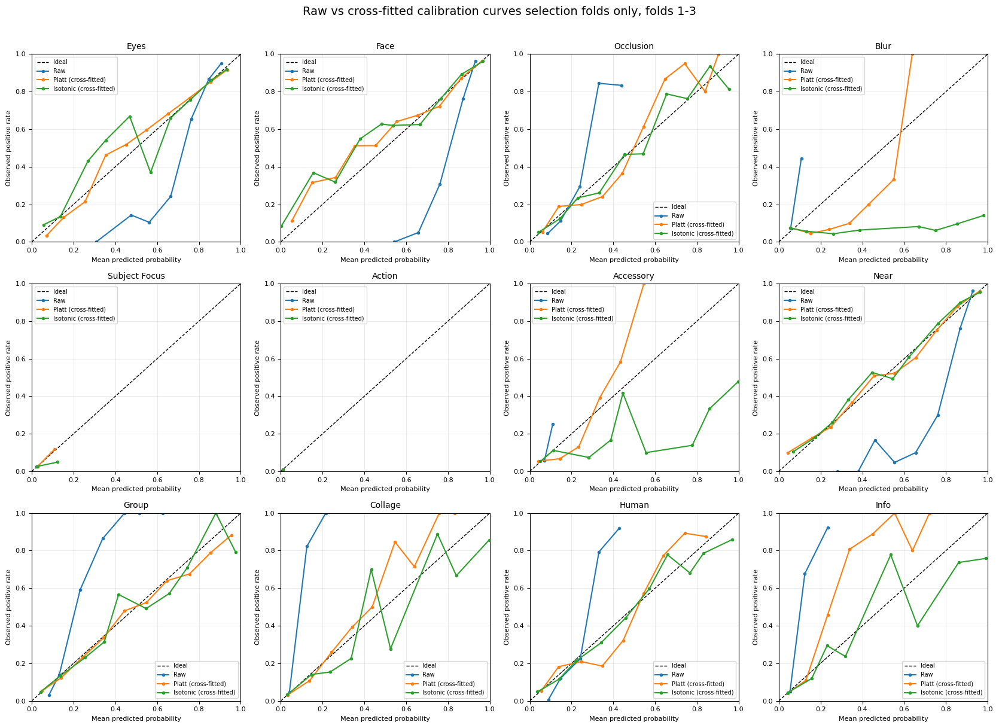

In [36]:
# ===================== part 6 =====================================
# SECTION 2 — STEP 2C
# Visual comparison of raw vs cross-fitted calibration

# - Compare raw, Platt, and isotonic reliability curves.
# - Curves are computed on the calibration-method selection folds only.
# - Folds 4 and 5 are not used in this diagnostic.
# ================================================================

from src.aux_calibration import (
    plot_calibration_comparison,
)

plot_calibration_comparison(
    bin_tables_by_task=bin_tables_by_task,
    aux_tasks=CALIBRATION_TASKS,
    title=(
        "Raw vs cross-fitted calibration curves "
        "selection folds only, folds 1-3"
    ),
    n_cols=4,
)

In [37]:
# ===================== part 7 =====================================
# SECTION 3 — STEP 3A
# Verify fixed threshold-selection / evaluation split
# ================================================================

assert set(threshold_selection_df["fold"].unique()) == set(THRESHOLD_SELECTION_FOLDS)
assert set(threshold_evaluation_df["fold"].unique()) == set(THRESHOLD_EVALUATION_FOLDS)

assert len(threshold_selection_df) + len(threshold_evaluation_df) == len(aux_selected_df)

print("Threshold-selection samples:", len(threshold_selection_df))
print("Final-evaluation samples:", len(threshold_evaluation_df))

print(
    "\nThreshold-selection folds:",
    sorted(threshold_selection_df["fold"].unique().tolist()),
)

print(
    "Final-evaluation folds:",
    sorted(threshold_evaluation_df["fold"].unique().tolist()),
)

print("\nTotal samples:", len(threshold_selection_df) + len(threshold_evaluation_df))
print("Original samples:", len(aux_selected_df))

Threshold-selection samples: 5948
Final-evaluation samples: 3964

Threshold-selection folds: [1, 2, 3]
Final-evaluation folds: [4, 5]

Total samples: 9912
Original samples: 9912


In [38]:
# ===================== part 8 =====================================
# SECTION 4 — STEP 4A
# selective-prediction threshold-pair sweep
#
# Uses ONLY threshold-selection folds 1, 2, 3 records.
#
# Three regions:
#
#   p <= t_neg
#       -> negative feedback
#
#   t_neg < p < t_pos
#       -> abstain / no feedback
#
#   p >= t_pos
#       -> positive feedback
#
# Metrics:
#   PPV = reliability of displayed positive feedback
#   NPV = reliability of displayed negative feedback
#   selective_accuracy = correctness among all displayed feedback
#   coverage = fraction of samples receiving feedback
#
# No threshold is selected yet.
# ================================================================

import numpy as np
import pandas as pd


DISPLAY_THRESHOLD_GRID = np.round(
    np.arange(0.01, 1.00, 0.01),
    2,
)


selective_rows = []


for task in CALIBRATION_TASKS:

    y_true = threshold_selection_df[
        f"{task}_true"
    ].to_numpy(dtype=int)

    y_prob = threshold_selection_df[
        f"{task}_prob_selected"
    ].to_numpy(dtype=float)

    probability_method = SELECTED_METHODS[task]

    n_total = len(y_true)


    for negative_threshold in DISPLAY_THRESHOLD_GRID:

        for positive_threshold in DISPLAY_THRESHOLD_GRID:

            # Valid abstention interval requires:
            # t_neg < t_pos
            if negative_threshold >= positive_threshold:
                continue


            # ------------------------------------------------
            # Three selective-prediction regions
            # ------------------------------------------------

            negative_mask = (
                y_prob <= negative_threshold
            )

            positive_mask = (
                y_prob >= positive_threshold
            )

            displayed_mask = (
                negative_mask | positive_mask
            )

            abstain_mask = ~displayed_mask


            # ------------------------------------------------
            # Confusion counts for displayed feedback
            # ------------------------------------------------

            TN = int(
                (
                    negative_mask
                    & (y_true == 0)
                ).sum()
            )

            FN = int(
                (
                    negative_mask
                    & (y_true == 1)
                ).sum()
            )

            TP = int(
                (
                    positive_mask
                    & (y_true == 1)
                ).sum()
            )

            FP = int(
                (
                    positive_mask
                    & (y_true == 0)
                ).sum()
            )


            # ------------------------------------------------
            # Display counts
            # ------------------------------------------------

            n_negative_displayed = int(
                negative_mask.sum()
            )

            n_positive_displayed = int(
                positive_mask.sum()
            )

            n_displayed = int(
                displayed_mask.sum()
            )

            n_abstained = int(
                abstain_mask.sum()
            )


            # ------------------------------------------------
            # PPV
            #
            # Among displayed POSITIVE feedback:
            # how often is the label actually positive?
            # ------------------------------------------------

            PPV = (
                TP / (TP + FP)
                if (TP + FP) > 0
                else np.nan
            )


            # ------------------------------------------------
            # NPV
            #
            # Among displayed NEGATIVE feedback:
            # how often is the label actually negative?
            # ------------------------------------------------

            NPV = (
                TN / (TN + FN)
                if (TN + FN) > 0
                else np.nan
            )


            # ------------------------------------------------
            # Selective accuracy
            #
            # Correct feedback among all non-abstained cases
            # ------------------------------------------------

            selective_accuracy = (
                (TP + TN) / n_displayed
                if n_displayed > 0
                else np.nan
            )


            # ------------------------------------------------
            # Coverage
            # ------------------------------------------------

            negative_coverage = (
                n_negative_displayed / n_total
            )

            positive_coverage = (
                n_positive_displayed / n_total
            )

            coverage = (
                n_displayed / n_total
            )

            abstention_rate = (
                n_abstained / n_total
            )


            selective_rows.append({

                "task":
                    task,

                "probability_method":
                    probability_method,

                "negative_threshold":
                    negative_threshold,

                "positive_threshold":
                    positive_threshold,

                "n_total":
                    n_total,

                "n_negative_displayed":
                    n_negative_displayed,

                "n_positive_displayed":
                    n_positive_displayed,

                "n_displayed":
                    n_displayed,

                "n_abstained":
                    n_abstained,

                "negative_coverage":
                    negative_coverage,

                "positive_coverage":
                    positive_coverage,

                "coverage":
                    coverage,

                "abstention_rate":
                    abstention_rate,

                "PPV":
                    PPV,

                "NPV":
                    NPV,

                "selective_accuracy":
                    selective_accuracy,

                "TP":
                    TP,

                "FP":
                    FP,

                "TN":
                    TN,

                "FN":
                    FN,
            })


selective_threshold_sweep_df = (
    pd.DataFrame(selective_rows)
    .sort_values(
        [
            "task",
            "negative_threshold",
            "positive_threshold",
        ]
    )
    .reset_index(drop=True)
)


print(
    "Candidate threshold pairs:",
    len(selective_threshold_sweep_df),
)

display(
    selective_threshold_sweep_df.head()
)



Candidate threshold pairs: 58212


,task,probability_method,negative_threshold,positive_threshold,n_total,n_negative_displayed,n_positive_displayed,n_displayed,n_abstained,negative_coverage,positive_coverage,coverage,abstention_rate,PPV,NPV,selective_accuracy,TP,FP,TN,FN
0,Accessory,raw,0.01,0.02,5948,0,5948,5948,0,0.0,1.000000,1.000000,0.000000,0.066913,NaN,0.066913,398,5550,0,0
1,Accessory,raw,0.01,0.03,5948,0,5948,5948,0,0.0,1.000000,1.000000,0.000000,0.066913,NaN,0.066913,398,5550,0,0
2,Accessory,raw,0.01,0.04,5948,0,5939,5939,9,0.0,0.998487,0.998487,0.001513,0.067015,NaN,0.067015,398,5541,0,0
3,Accessory,raw,0.01,0.05,5948,0,5467,5467,481,0.0,0.919132,0.919132,0.080868,0.071337,NaN,0.071337,390,5077,0,0
4,Accessory,raw,0.01,0.06,5948,0,4145,4145,1803,0.0,0.696873,0.696873,0.303127,0.082509,NaN,0.082509,342,3803,0,0


In [39]:
# ===================== part 9 =====================================
# SECTION 4 — STEP 4B
# Direction-specific operating-point selection on folds 1–3
#
# For each threshold pair:
# - allow positive direction if PPV >= reliability target
# - allow negative direction if NPV >= reliability target
# - require minimum support separately for each direction
#
# The selected policy is frozen before folds 4–5.
# ================================================================

RELIABILITY_TARGETS = [0.80, 0.85, 0.90, 0.95]

MIN_POSITIVE_SUPPORT = 50
MIN_NEGATIVE_SUPPORT = 50

operating_point_rows = []

for task in CALIBRATION_TASKS:

    task_pairs = selective_threshold_sweep_df[
        selective_threshold_sweep_df["task"] == task
    ].copy()

    probability_method = SELECTED_METHODS[task]

    for reliability_target in RELIABILITY_TARGETS:

        pairs = task_pairs.copy()

        pairs["allow_positive"] = (
            (pairs["PPV"] >= reliability_target)
            & (pairs["n_positive_displayed"] >= MIN_POSITIVE_SUPPORT)
        )

        pairs["allow_negative"] = (
            (pairs["NPV"] >= reliability_target)
            & (pairs["n_negative_displayed"] >= MIN_NEGATIVE_SUPPORT)
        )

        valid = pairs[
            pairs["allow_positive"] | pairs["allow_negative"]
        ].copy()

        if len(valid) == 0:
            operating_point_rows.append({
                "task": task,
                "probability_method": probability_method,
                "reliability_target": reliability_target,
                "selection_feasible": False,
                "allow_positive": False,
                "allow_negative": False,
                "negative_threshold": np.nan,
                "positive_threshold": np.nan,
                "n_total": len(threshold_selection_df),
                "n_negative_displayed": 0,
                "n_positive_displayed": 0,
                "n_displayed": 0,
                "n_abstained": len(threshold_selection_df),
                "negative_coverage": 0.0,
                "positive_coverage": 0.0,
                "coverage": 0.0,
                "abstention_rate": 1.0,
                "PPV": np.nan,
                "NPV": np.nan,
                "selective_accuracy": np.nan,
                "TP": 0,
                "FP": 0,
                "TN": 0,
                "FN": 0,
            })
            continue

        valid["allowed_positive_count"] = np.where(
            valid["allow_positive"],
            valid["n_positive_displayed"],
            0,
        )

        valid["allowed_negative_count"] = np.where(
            valid["allow_negative"],
            valid["n_negative_displayed"],
            0,
        )

        valid["allowed_displayed_count"] = (
            valid["allowed_positive_count"]
            + valid["allowed_negative_count"]
        )

        valid["allowed_coverage"] = (
            valid["allowed_displayed_count"]
            / valid["n_total"]
        )

        valid["allowed_correct_count"] = (
            np.where(valid["allow_positive"], valid["TP"], 0)
            + np.where(valid["allow_negative"], valid["TN"], 0)
        )

        valid["allowed_selective_accuracy"] = (
            valid["allowed_correct_count"]
            / valid["allowed_displayed_count"]
        )

        chosen = (
            valid
            .sort_values(
                ["allowed_coverage", "allowed_selective_accuracy"],
                ascending=[False, False],
            )
            .iloc[0]
        )

        allow_positive = bool(chosen["allow_positive"])
        allow_negative = bool(chosen["allow_negative"])

        TP = int(chosen["TP"]) if allow_positive else 0
        FP = int(chosen["FP"]) if allow_positive else 0
        TN = int(chosen["TN"]) if allow_negative else 0
        FN = int(chosen["FN"]) if allow_negative else 0

        n_positive = int(chosen["n_positive_displayed"]) if allow_positive else 0
        n_negative = int(chosen["n_negative_displayed"]) if allow_negative else 0
        n_displayed = n_positive + n_negative
        n_total = int(chosen["n_total"])
        n_abstained = n_total - n_displayed

        PPV = TP / (TP + FP) if (TP + FP) > 0 else np.nan
        NPV = TN / (TN + FN) if (TN + FN) > 0 else np.nan
        selective_accuracy = (TP + TN) / n_displayed if n_displayed > 0 else np.nan

        operating_point_rows.append({
            "task": task,
            "probability_method": probability_method,
            "reliability_target": reliability_target,
            "selection_feasible": True,
            "allow_positive": allow_positive,
            "allow_negative": allow_negative,
            "negative_threshold": chosen["negative_threshold"],
            "positive_threshold": chosen["positive_threshold"],
            "n_total": n_total,
            "n_negative_displayed": n_negative,
            "n_positive_displayed": n_positive,
            "n_displayed": n_displayed,
            "n_abstained": n_abstained,
            "negative_coverage": n_negative / n_total,
            "positive_coverage": n_positive / n_total,
            "coverage": n_displayed / n_total,
            "abstention_rate": n_abstained / n_total,
            "PPV": PPV,
            "NPV": NPV,
            "selective_accuracy": selective_accuracy,
            "TP": TP,
            "FP": FP,
            "TN": TN,
            "FN": FN,
        })

operating_points_df = (
    pd.DataFrame(operating_point_rows)
    .sort_values(["task", "reliability_target"])
    .reset_index(drop=True)
)

print("Candidate operating points selected using folds 1–3 only:")

display(
    operating_points_df[
        [
            "task",
            "probability_method",
            "reliability_target",
            "selection_feasible",
            "allow_positive",
            "allow_negative",
            "negative_threshold",
            "positive_threshold",
            "n_negative_displayed",
            "n_positive_displayed",
            "negative_coverage",
            "positive_coverage",
            "PPV",
            "NPV",
            "coverage",
            "abstention_rate",
            "selective_accuracy",
        ]
    ].round(4)
)

Candidate operating points selected using folds 1–3 only:


,task,probability_method,reliability_target,selection_feasible,allow_positive,allow_negative,negative_threshold,positive_threshold,n_negative_displayed,n_positive_displayed,negative_coverage,positive_coverage,PPV,NPV,coverage,abstention_rate,selective_accuracy
0,Accessory,raw,0.80,True,False,True,0.16,0.17,5948,0,1.0000,0.0000,NaN,0.9331,1.0000,0.0000,0.9331
1,Accessory,raw,0.85,True,False,True,0.16,0.17,5948,0,1.0000,0.0000,NaN,0.9331,1.0000,0.0000,0.9331
2,Accessory,raw,0.90,True,False,True,0.16,0.17,5948,0,1.0000,0.0000,NaN,0.9331,1.0000,0.0000,0.9331
3,Accessory,raw,0.95,True,False,True,0.09,0.10,5048,0,0.8487,0.0000,NaN,0.9505,0.8487,0.1513,0.9505
4,Action,platt,0.80,True,False,True,0.02,0.03,5948,0,1.0000,0.0000,NaN,0.9896,1.0000,0.0000,0.9896
5,Action,platt,0.85,True,False,True,0.02,0.03,5948,0,1.0000,0.0000,NaN,0.9896,1.0000,0.0000,0.9896
6,Action,platt,0.90,True,False,True,0.02,0.03,5948,0,1.0000,0.0000,NaN,0.9896,1.0000,0.0000,0.9896
7,Action,platt,0.95,True,False,True,0.02,0.03,5948,0,1.0000,0.0000,NaN,0.9896,1.0000,0.0000,0.9896
8,Blur,raw,0.80,True,False,True,0.13,0.14,5948,0,1.0000,0.0000,NaN,0.9287,1.0000,0.0000,0.9287
9,Blur,raw,0.85,True,False,True,0.13,0.14,5948,0,1.0000,0.0000,NaN,0.9287,1.0000,0.0000,0.9287


Reliability target vs PPV, NPV, and coverage (threshold-selection folds 1–3 only):


,reliability_target,n_tasks_feasible,mean_PPV,median_PPV,mean_NPV,median_NPV,mean_coverage,median_coverage
0,0.80,12,0.8298,0.8085,0.9099,0.9287,0.9997,1.0000
1,0.85,12,0.8727,0.8667,0.9140,0.9287,0.9781,0.9997
2,0.90,12,0.9145,0.9035,0.9345,0.9287,0.8740,0.9954
3,0.95,12,0.9516,0.9506,0.9602,0.9513,0.6554,0.7765


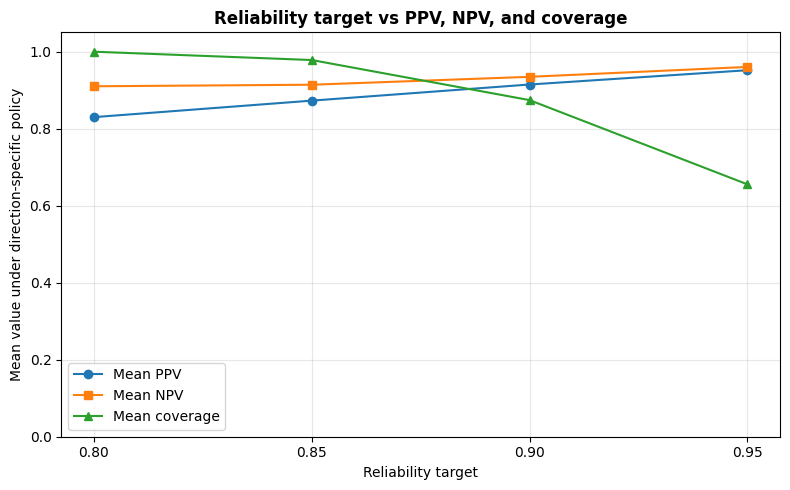

In [40]:
# ===================== part 9A====================================
# Reliability target vs direction-specific reliability and coverage
#
# - PPV summarizes allowed positive-feedback directions.
# - NPV summarizes allowed negative-feedback directions.
# - Coverage shows how often the frozen direction-specific policy gives feedback.
# - A task is feasible if at least one direction is allowed.
# ================================================================
import matplotlib.pyplot as plt

target_metric_rows = []

for target in sorted(
    operating_points_df["reliability_target"].unique()
):

    target_df = operating_points_df[
        operating_points_df["reliability_target"] == target
    ].copy()

    feasible_df = target_df[
        target_df["selection_feasible"]
    ].copy()

    target_metric_rows.append({

        "reliability_target":
            target,

        "n_tasks_feasible":
            int(feasible_df["task"].nunique()),

        "mean_PPV":
            feasible_df["PPV"].mean(),

        "median_PPV":
            feasible_df["PPV"].median(),

        "mean_NPV":
            feasible_df["NPV"].mean(),

        "median_NPV":
            feasible_df["NPV"].median(),

        "mean_coverage":
            feasible_df["coverage"].mean(),

        "median_coverage":
            feasible_df["coverage"].median(),
    })


target_metric_df = (
    pd.DataFrame(target_metric_rows)
    .sort_values("reliability_target")
    .reset_index(drop=True)
)

print(
    "Reliability target vs PPV, NPV, and coverage "
    "(threshold-selection folds 1–3 only):"
)

display(
    target_metric_df.round(4)
)


fig, ax = plt.subplots(
    figsize=(8, 5)
)

ax.plot(
    target_metric_df["reliability_target"],
    target_metric_df["mean_PPV"],
    marker="o",
    label="Mean PPV",
)

ax.plot(
    target_metric_df["reliability_target"],
    target_metric_df["mean_NPV"],
    marker="s",
    label="Mean NPV",
)

ax.plot(
    target_metric_df["reliability_target"],
    target_metric_df["mean_coverage"],
    marker="^",
    label="Mean coverage",
)


ax.set_title(
    "Reliability target vs PPV, NPV, and coverage",
    fontweight="bold",
)

ax.set_xlabel(
    "Reliability target"
)

ax.set_ylabel(
    "Mean value under direction-specific policy"
)

ax.set_xticks(
    target_metric_df["reliability_target"]
)

ax.set_ylim(
    0,
    1.05,
)

ax.grid(
    True,
    alpha=0.3,
)

ax.legend()

plt.tight_layout()
plt.show()

In [41]:
# ===================== part 10 ====================================
# SECTION 4 — STEP 4C
# Freeze the final reliability target and full operating policy
# ================================================================

FINAL_RELIABILITY_TARGET = 0.90

selected_operating_points_df = (
    operating_points_df[
        operating_points_df["reliability_target"] == FINAL_RELIABILITY_TARGET
    ]
    .copy()
    .sort_values("task")
    .reset_index(drop=True)
)

required_cols = {"allow_positive", "allow_negative"}
assert required_cols.issubset(selected_operating_points_df.columns)

print(
    "Frozen selective-feedback policy "
    f"for reliability target = {FINAL_RELIABILITY_TARGET:.2f}"
)

display(
    selected_operating_points_df[
        [
            "task",
            "probability_method",
            "selection_feasible",
            "allow_positive",
            "allow_negative",
            "negative_threshold",
            "positive_threshold",
            "n_negative_displayed",
            "n_positive_displayed",
            "negative_coverage",
            "positive_coverage",
            "PPV",
            "NPV",
            "coverage",
            "abstention_rate",
            "selective_accuracy",
        ]
    ].round(4)
)

Frozen selective-feedback policy for reliability target = 0.90


,task,probability_method,selection_feasible,allow_positive,allow_negative,negative_threshold,positive_threshold,n_negative_displayed,n_positive_displayed,negative_coverage,positive_coverage,PPV,NPV,coverage,abstention_rate,selective_accuracy
0,Accessory,raw,True,False,True,0.16,0.17,5948,0,1.0000,0.0000,NaN,0.9331,1.0000,0.0000,0.9331
1,Action,platt,True,False,True,0.02,0.03,5948,0,1.0000,0.0000,NaN,0.9896,1.0000,0.0000,0.9896
2,Blur,raw,True,False,True,0.13,0.14,5948,0,1.0000,0.0000,NaN,0.9287,1.0000,0.0000,0.9287
3,Collage,platt,True,False,True,0.86,0.87,5948,0,1.0000,0.0000,NaN,0.9474,1.0000,0.0000,0.9474
4,Eyes,platt,True,True,True,0.18,0.87,84,2263,0.0141,0.3805,0.9010,0.9286,0.3946,0.6054,0.9020
5,Face,platt,True,True,False,0.01,0.02,0,5944,0.0000,0.9993,0.9056,NaN,0.9993,0.0007,0.9056
6,Group,platt,True,False,True,0.41,0.42,5559,0,0.9346,0.0000,NaN,0.9007,0.9346,0.0654,0.9007
7,Human,isotonic,True,True,True,0.21,0.95,3741,60,0.6290,0.0101,0.9500,0.9147,0.6390,0.3610,0.9153
8,Info,isotonic,True,False,True,0.97,0.98,5897,0,0.9914,0.0000,NaN,0.9432,0.9914,0.0086,0.9432
9,Near,platt,True,True,True,0.13,0.54,80,5468,0.0134,0.9193,0.9014,0.9000,0.9328,0.0672,0.9014


In [42]:
# ===================== part 11 ====================================
# SECTION 4 — STEP 4D
# Held-out evaluation of the frozen selective-feedback policy
# ================================================================

evaluation_rows = []

for row in selected_operating_points_df.itertuples(index=False):

    task = row.task
    method = row.probability_method
    feasible = bool(row.selection_feasible)
    allow_positive = bool(row.allow_positive)
    allow_negative = bool(row.allow_negative)

    if not feasible:
        evaluation_rows.append({
            "task": task,
            "probability_method": method,
            "selection_feasible": False,
            "allow_positive": False,
            "allow_negative": False,
            "negative_threshold": np.nan,
            "positive_threshold": np.nan,
            "n_total": len(threshold_evaluation_df),
            "n_negative_displayed": 0,
            "n_positive_displayed": 0,
            "n_displayed": 0,
            "n_abstained": len(threshold_evaluation_df),
            "negative_coverage": 0.0,
            "positive_coverage": 0.0,
            "coverage": 0.0,
            "abstention_rate": 1.0,
            "PPV": np.nan,
            "NPV": np.nan,
            "selective_accuracy": np.nan,
            "TP": 0,
            "FP": 0,
            "TN": 0,
            "FN": 0,
        })
        continue

    t_neg = float(row.negative_threshold)
    t_pos = float(row.positive_threshold)

    y_true = threshold_evaluation_df[f"{task}_true"].to_numpy(dtype=int)
    y_prob = threshold_evaluation_df[f"{task}_prob_selected"].to_numpy(dtype=float)

    raw_negative_mask = y_prob <= t_neg
    raw_positive_mask = y_prob >= t_pos

    negative_mask = raw_negative_mask if allow_negative else np.zeros_like(raw_negative_mask, dtype=bool)
    positive_mask = raw_positive_mask if allow_positive else np.zeros_like(raw_positive_mask, dtype=bool)

    displayed_mask = negative_mask | positive_mask
    abstain_mask = ~displayed_mask

    TN = int((negative_mask & (y_true == 0)).sum())
    FN = int((negative_mask & (y_true == 1)).sum())
    TP = int((positive_mask & (y_true == 1)).sum())
    FP = int((positive_mask & (y_true == 0)).sum())

    n_total = len(y_true)
    n_negative_displayed = int(negative_mask.sum())
    n_positive_displayed = int(positive_mask.sum())
    n_displayed = int(displayed_mask.sum())
    n_abstained = int(abstain_mask.sum())

    PPV = TP / (TP + FP) if (TP + FP) > 0 else np.nan
    NPV = TN / (TN + FN) if (TN + FN) > 0 else np.nan
    selective_accuracy = (TP + TN) / n_displayed if n_displayed > 0 else np.nan

    evaluation_rows.append({
        "task": task,
        "probability_method": method,
        "selection_feasible": True,
        "allow_positive": allow_positive,
        "allow_negative": allow_negative,
        "negative_threshold": t_neg,
        "positive_threshold": t_pos,
        "n_total": n_total,
        "n_negative_displayed": n_negative_displayed,
        "n_positive_displayed": n_positive_displayed,
        "n_displayed": n_displayed,
        "n_abstained": n_abstained,
        "negative_coverage": n_negative_displayed / n_total,
        "positive_coverage": n_positive_displayed / n_total,
        "coverage": n_displayed / n_total,
        "abstention_rate": n_abstained / n_total,
        "PPV": PPV,
        "NPV": NPV,
        "selective_accuracy": selective_accuracy,
        "TP": TP,
        "FP": FP,
        "TN": TN,
        "FN": FN,
    })

evaluation_df = (
    pd.DataFrame(evaluation_rows)
    .sort_values("task")
    .reset_index(drop=True)
)

print("Held-out evaluation of frozen policy on folds 4–5:")

display(
    evaluation_df[
        [
            "task",
            "probability_method",
            "selection_feasible",
            "allow_positive",
            "allow_negative",
            "negative_threshold",
            "positive_threshold",
            "n_positive_displayed",
            "PPV",
            "n_negative_displayed",
            "NPV",
            "positive_coverage",
            "negative_coverage",
            "coverage",
            "abstention_rate",
            "selective_accuracy",
            "TP",
            "FP",
            "TN",
            "FN",
        ]
    ].round(4)
)

Held-out evaluation of frozen policy on folds 4–5:


,task,probability_method,selection_feasible,allow_positive,allow_negative,negative_threshold,positive_threshold,n_positive_displayed,PPV,n_negative_displayed,NPV,positive_coverage,negative_coverage,coverage,abstention_rate,selective_accuracy,TP,FP,TN,FN
0,Accessory,raw,True,False,True,0.16,0.17,0,NaN,3964,0.9309,0.0000,1.0000,1.0000,0.0000,0.9309,0,0,3690,274
1,Action,platt,True,False,True,0.02,0.03,0,NaN,3964,0.9907,0.0000,1.0000,1.0000,0.0000,0.9907,0,0,3927,37
2,Blur,raw,True,False,True,0.13,0.14,0,NaN,3964,0.9309,0.0000,1.0000,1.0000,0.0000,0.9309,0,0,3690,274
3,Collage,platt,True,False,True,0.86,0.87,0,NaN,3955,0.9570,0.0000,0.9977,0.9977,0.0023,0.9570,0,0,3785,170
4,Eyes,platt,True,True,True,0.18,0.87,787,0.9377,62,0.8710,0.1985,0.0156,0.2142,0.7858,0.9329,738,49,54,8
5,Face,platt,True,True,False,0.01,0.02,3964,0.9024,0,NaN,1.0000,0.0000,1.0000,0.0000,0.9024,3577,387,0,0
6,Group,platt,True,False,True,0.41,0.42,0,NaN,3520,0.9159,0.0000,0.8880,0.8880,0.1120,0.9159,0,0,3224,296
7,Human,isotonic,True,True,True,0.21,0.95,66,0.8333,2522,0.9144,0.0166,0.6362,0.6529,0.3471,0.9123,55,11,2306,216
8,Info,isotonic,True,False,True,0.97,0.98,0,NaN,3956,0.9436,0.0000,0.9980,0.9980,0.0020,0.9436,0,0,3733,223
9,Near,platt,True,True,True,0.13,0.54,3281,0.9393,132,0.8409,0.8277,0.0333,0.8610,0.1390,0.9355,3082,199,111,21


In [43]:
# =====================  13 ====================================
# SECTION 4 — STEP 4F
# Compare threshold-selection performance with held-out performance
#
# 
# - Show whether the frozen operating point generalizes.
# - Compare PPV, NPV, coverage, and directional support.
#
# No threshold modification occurs here.
# ================================================================

selection_eval_rows = []


for task in CALIBRATION_TASKS:

    # ------------------------------------------------------------
    # Selection-set result: folds 1, 2, 3
    # ------------------------------------------------------------

    sel = selected_operating_points_df[
        selected_operating_points_df["task"] == task
    ].iloc[0]


    # ------------------------------------------------------------
    # Held-out result: folds 4, 5
    # ------------------------------------------------------------

    ev = evaluation_df[
        evaluation_df["task"] == task
    ].iloc[0]


    selection_eval_rows.append({

        "task":
            task,

        "probability_method":
            sel["probability_method"],

        "selection_feasible":
            bool(sel["selection_feasible"]),

        "negative_threshold":
            sel["negative_threshold"],

        "positive_threshold":
            sel["positive_threshold"],


        # ---------------- Selection ----------------

        "selection_PPV":
            sel["PPV"],

        "evaluation_PPV":
            ev["PPV"],

        "PPV_change":
            (
                ev["PPV"] - sel["PPV"]
                if (
                    not pd.isna(ev["PPV"])
                    and not pd.isna(sel["PPV"])
                )
                else np.nan
            ),


        "selection_NPV":
            sel["NPV"],

        "evaluation_NPV":
            ev["NPV"],

        "NPV_change":
            (
                ev["NPV"] - sel["NPV"]
                if (
                    not pd.isna(ev["NPV"])
                    and not pd.isna(sel["NPV"])
                )
                else np.nan
            ),


        # ---------------- Coverage ----------------

        "selection_coverage":
            sel["coverage"],

        "evaluation_coverage":
            ev["coverage"],

        "coverage_change":
            (
                ev["coverage"]
                - sel["coverage"]
            ),


        # ---------------- Directional support ----------------

        "selection_n_positive":
            int(sel["n_positive_displayed"]),

        "evaluation_n_positive":
            int(ev["n_positive_displayed"]),

        "selection_n_negative":
            int(sel["n_negative_displayed"]),

        "evaluation_n_negative":
            int(ev["n_negative_displayed"]),
    })


selection_vs_evaluation_df = (
    pd.DataFrame(selection_eval_rows)
    .sort_values("task")
    .reset_index(drop=True)
)


print(
    "Selection-set vs held-out generalization:"
)


display(
    selection_vs_evaluation_df[
        [
            "task",

            "negative_threshold",
            "positive_threshold",

            "selection_PPV",
            "evaluation_PPV",
            "PPV_change",

            "selection_NPV",
            "evaluation_NPV",
            "NPV_change",

            "selection_coverage",
            "evaluation_coverage",
            "coverage_change",

            "selection_n_positive",
            "evaluation_n_positive",

            "selection_n_negative",
            "evaluation_n_negative",
        ]
    ].round(4)
)

Selection-set vs held-out generalization:


,task,negative_threshold,positive_threshold,selection_PPV,evaluation_PPV,PPV_change,selection_NPV,evaluation_NPV,NPV_change,selection_coverage,evaluation_coverage,coverage_change,selection_n_positive,evaluation_n_positive,selection_n_negative,evaluation_n_negative
0,Accessory,0.16,0.17,NaN,NaN,NaN,0.9331,0.9309,-0.0022,1.0000,1.0000,0.0000,0,0,5948,3964
1,Action,0.02,0.03,NaN,NaN,NaN,0.9896,0.9907,0.0011,1.0000,1.0000,0.0000,0,0,5948,3964
2,Blur,0.13,0.14,NaN,NaN,NaN,0.9287,0.9309,0.0022,1.0000,1.0000,0.0000,0,0,5948,3964
3,Collage,0.86,0.87,NaN,NaN,NaN,0.9474,0.9570,0.0096,1.0000,0.9977,-0.0023,0,0,5948,3955
4,Eyes,0.18,0.87,0.9010,0.9377,0.0367,0.9286,0.8710,-0.0576,0.3946,0.2142,-0.1804,2263,787,84,62
5,Face,0.01,0.02,0.9056,0.9024,-0.0032,NaN,NaN,NaN,0.9993,1.0000,0.0007,5944,3964,0,0
6,Group,0.41,0.42,NaN,NaN,NaN,0.9007,0.9159,0.0152,0.9346,0.8880,-0.0466,0,0,5559,3520
7,Human,0.21,0.95,0.9500,0.8333,-0.1167,0.9147,0.9144,-0.0004,0.6390,0.6529,0.0138,60,66,3741,2522
8,Info,0.97,0.98,NaN,NaN,NaN,0.9432,0.9436,0.0004,0.9914,0.9980,0.0066,0,0,5897,3956
9,Near,0.13,0.54,0.9014,0.9393,0.0379,0.9000,0.8409,-0.0591,0.9328,0.8610,-0.0718,5468,3281,80,132


In [44]:
# ===================== part 16 ====================================
# SECTION 4 — STEP 4G
# Final held-out reporting table
#
# Reporting only. Does not change thresholds or allowed directions.
# ================================================================

final_results_df = evaluation_df[
    [
        "task",
        "probability_method",
        "selection_feasible",
        "allow_positive",
        "allow_negative",
        "negative_threshold",
        "positive_threshold",
        "n_positive_displayed",
        "PPV",
        "n_negative_displayed",
        "NPV",
        "coverage",
        "abstention_rate",
        "selective_accuracy",
    ]
].copy()

print(
    "Final held-out selective-feedback results "
    "(complete policy selected on folds 1–3; evaluated on folds 4–5):"
)

display(final_results_df.round(4))

Final held-out selective-feedback results (complete policy selected on folds 1–3; evaluated on folds 4–5):


,task,probability_method,selection_feasible,allow_positive,allow_negative,negative_threshold,positive_threshold,n_positive_displayed,PPV,n_negative_displayed,NPV,coverage,abstention_rate,selective_accuracy
0,Accessory,raw,True,False,True,0.16,0.17,0,NaN,3964,0.9309,1.0000,0.0000,0.9309
1,Action,platt,True,False,True,0.02,0.03,0,NaN,3964,0.9907,1.0000,0.0000,0.9907
2,Blur,raw,True,False,True,0.13,0.14,0,NaN,3964,0.9309,1.0000,0.0000,0.9309
3,Collage,platt,True,False,True,0.86,0.87,0,NaN,3955,0.9570,0.9977,0.0023,0.9570
4,Eyes,platt,True,True,True,0.18,0.87,787,0.9377,62,0.8710,0.2142,0.7858,0.9329
5,Face,platt,True,True,False,0.01,0.02,3964,0.9024,0,NaN,1.0000,0.0000,0.9024
6,Group,platt,True,False,True,0.41,0.42,0,NaN,3520,0.9159,0.8880,0.1120,0.9159
7,Human,isotonic,True,True,True,0.21,0.95,66,0.8333,2522,0.9144,0.6529,0.3471,0.9123
8,Info,isotonic,True,False,True,0.97,0.98,0,NaN,3956,0.9436,0.9980,0.0020,0.9436
9,Near,platt,True,True,True,0.13,0.54,3281,0.9393,132,0.8409,0.8610,0.1390,0.9355


In [45]:
# ===================== part 17 ====================================
# SECTION 5 — STEP 5A
# Reconstruct split calibration models for prototype testing
#
# 
# - The prototype model outputs RAW sigmoid probabilities.
# - The selective thresholds were defined on SELECTED/CALIBRATED probabilities.
# - Therefore raw model outputs must first be transformed using the
#   selected calibration method.
#
# Split:
# - Calibration methods were selected using folds 1,2,3.
# - Thresholds were selected using folds 1,2,3.
# - Folds 4,5 are final evaluation folds.
#
# Therefore, for prototype evaluation on folds 4,5:
#   fit calibrators on folds 1,2,3 only
#   apply calibrators to folds 4,5
# ================================================================

from src.aux_calibration import (
    fit_platt_calibrator,
    fit_isotonic_calibrator,
    apply_calibrator,
)


def probability_to_logit(prob):
    """
    Inverse-sigmoid transformation used for Platt-style calibration.
    """
    prob = np.asarray(prob, dtype=float)

    prob = np.clip(
        prob,
        1e-7,
        1.0 - 1e-7,
    )

    return np.log(
        prob / (1.0 - prob)
    )


# ------------------------------------------------------------
# Build calibrators for final-evaluation folds.
#
# 
# Both fold 4 and fold 5 use calibrators fitted only on folds 1,2,3.
# Fold 4 must not use fold 5.
# Fold 5 must not use fold 4.
# ------------------------------------------------------------

PROTOTYPE_EVAL_FOLDS = THRESHOLD_EVALUATION_FOLDS.copy()

calibration_fit_df = aux_df[
    aux_df["fold"].isin(THRESHOLD_SELECTION_FOLDS)
].copy()

fold_calibrators = {}

for heldout_fold in PROTOTYPE_EVAL_FOLDS:

    fold_calibrators[heldout_fold] = {}

    for task in CALIBRATION_TASKS:

        method = SELECTED_METHODS[task]

        y_true_fit = calibration_fit_df[
            f"{task}_true"
        ].to_numpy(dtype=int)

        raw_prob_fit = calibration_fit_df[
            f"{task}_prob"
        ].to_numpy(dtype=float)

        if method == "raw":

            calibrator = None

        elif method == "platt":

            logit_fit = probability_to_logit(
                raw_prob_fit
            )

            calibrator = fit_platt_calibrator(
                y_score_fit=logit_fit,
                y_true_fit=y_true_fit,
            )

        elif method == "isotonic":

            calibrator = fit_isotonic_calibrator(
                y_prob_fit=raw_prob_fit,
                y_true_fit=y_true_fit,
            )

        else:

            raise ValueError(
                f"Unknown calibration method for {task}: {method}"
            )

        fold_calibrators[heldout_fold][task] = calibrator


print(
    "Built split-clean calibrators for folds:",
    sorted(fold_calibrators.keys()),
)

print(
    "Calibrator fitting folds:",
    sorted(calibration_fit_df["fold"].unique().tolist()),
)


# ================================================================
# Verification:
# Reconstruct selected probabilities for folds 4,5 from raw OOF
# probabilities and compare with threshold_evaluation_df.
#
# Expected result:
# differences should be exactly 0 or very close to floating precision.
# ================================================================

verification_rows = []

for heldout_fold in PROTOTYPE_EVAL_FOLDS:

    for task in CALIBRATION_TASKS:

        method = SELECTED_METHODS[task]

        check_df = (
            aux_df.loc[
                aux_df["fold"] == heldout_fold,
                [
                    "Id",
                    f"{task}_prob",
                ],
            ]
            .merge(
                threshold_evaluation_df.loc[
                    threshold_evaluation_df["fold"] == heldout_fold,
                    [
                        "Id",
                        f"{task}_prob_selected",
                    ],
                ],
                on="Id",
                how="inner",
            )
        )

        raw_prob = check_df[
            f"{task}_prob"
        ].to_numpy(dtype=float)

        if method == "raw":

            reconstructed_prob = raw_prob

        elif method == "platt":

            raw_logit = probability_to_logit(
                raw_prob
            )

            reconstructed_prob = apply_calibrator(
                y_prob=raw_logit,
                method="platt",
                calibrator=fold_calibrators[
                    heldout_fold
                ][task],
            )

        elif method == "isotonic":

            reconstructed_prob = apply_calibrator(
                y_prob=raw_prob,
                method="isotonic",
                calibrator=fold_calibrators[
                    heldout_fold
                ][task],
            )

        else:

            raise ValueError(
                f"Unknown calibration method for {task}: {method}"
            )

        selected_prob = check_df[
            f"{task}_prob_selected"
        ].to_numpy(dtype=float)

        absolute_difference = np.abs(
            reconstructed_prob
            - selected_prob
        )

        verification_rows.append({

            "fold":
                heldout_fold,

            "task":
                task,

            "method":
                method,

            "n":
                len(check_df),

            "mean_abs_difference":
                float(absolute_difference.mean()),

            "max_abs_difference":
                float(absolute_difference.max()),
        })


calibration_reconstruction_check_df = (
    pd.DataFrame(verification_rows)
    .sort_values(
        ["fold", "task"]
    )
    .reset_index(drop=True)
)


print(
    "\nCalibration reconstruction check:"
)

display(
    calibration_reconstruction_check_df.round(10)
)

print(
    "\nOverall maximum absolute difference:",
    calibration_reconstruction_check_df[
        "max_abs_difference"
    ].max(),
)

assert (
    calibration_reconstruction_check_df[
        "max_abs_difference"
    ].max()
    < 1e-10
)

Built split-clean calibrators for folds: [4, 5]
Calibrator fitting folds: [1, 2, 3]

Calibration reconstruction check:


,fold,task,method,n,mean_abs_difference,max_abs_difference
0,4,Accessory,raw,1982,0.0,0.0
1,4,Action,platt,1982,0.0,0.0
2,4,Blur,raw,1982,0.0,0.0
3,4,Collage,platt,1982,0.0,0.0
4,4,Eyes,platt,1982,0.0,0.0
5,4,Face,platt,1982,0.0,0.0
6,4,Group,platt,1982,0.0,0.0
7,4,Human,isotonic,1982,0.0,0.0
8,4,Info,isotonic,1982,0.0,0.0
9,4,Near,platt,1982,0.0,0.0



Overall maximum absolute difference: 0.0


In [46]:
# ===================== part 18 ====================================
# SECTION 5 — STEP 5B
# Reusable calibration helper for raw auxiliary probabilities
#
# Input:
#   raw_probs = {
#       "Eyes": 0.82,
#       "Face": 0.91,
#       ...
#   }
#
# Output:
#   calibrated_probs = {
#       "Eyes": ...,
#       "Face": ...,
#       ...
#   }
#
# heldout_fold determines which fold-specific calibrator is used.
# ================================================================


def calibrate_aux_probabilities(
    raw_probs,
    heldout_fold,
    selected_methods=SELECTED_METHODS,
    calibrators_by_fold=fold_calibrators,
):
    """
    Convert raw auxiliary sigmoid probabilities into the calibrated
    probability space used by the selective-prediction thresholds.

    Parameters
    ----------
    raw_probs : dict
        {task: raw sigmoid probability}

    heldout_fold : int
        Evaluation fold whose split-clean calibrator should be used.

    Returns
    -------
    dict
        {task: calibrated probability}
    """

    if heldout_fold not in calibrators_by_fold:
        raise ValueError(
            f"No calibrators available for fold {heldout_fold}. "
            f"Available folds: {sorted(calibrators_by_fold.keys())}"
        )


    calibrated_probs = {}


    for task, raw_prob in raw_probs.items():

        if task not in selected_methods:
            raise KeyError(
                f"No selected calibration method for task: {task}"
            )

        method = selected_methods[task]

        raw_prob = float(raw_prob)


        # ----------------------------------------------------
        # RAW
        # ----------------------------------------------------

        if method == "raw":

            calibrated_prob = raw_prob


        # ----------------------------------------------------
        # PLATT
        # ----------------------------------------------------

        elif method == "platt":

            raw_logit = probability_to_logit(
                [raw_prob]
            )

            calibrated_prob = apply_calibrator(
                y_prob=raw_logit,
                method="platt",
                calibrator=calibrators_by_fold[
                    heldout_fold
                ][task],
            )[0]


        # ----------------------------------------------------
        # ISOTONIC
        # ----------------------------------------------------

        elif method == "isotonic":

            calibrated_prob = apply_calibrator(
                y_prob=np.array(
                    [raw_prob],
                    dtype=float,
                ),
                method="isotonic",
                calibrator=calibrators_by_fold[
                    heldout_fold
                ][task],
            )[0]


        else:

            raise ValueError(
                f"Unknown calibration method "
                f"for {task}: {method}"
            )


        calibrated_probs[task] = float(
            calibrated_prob
        )


    return calibrated_probs

# ================================================================
# Sanity check using one real OOF sample from fold 4
# ================================================================

CHECK_FOLD = 4


example_raw_row = (
    aux_df[
        aux_df["fold"] == CHECK_FOLD
    ]
    .iloc[0]
)


example_id = example_raw_row["Id"]


example_raw_probs = {
    task: float(
        example_raw_row[f"{task}_prob"]
    )
    for task in CALIBRATION_TASKS
}


example_calibrated_probs = (
    calibrate_aux_probabilities(
        raw_probs=example_raw_probs,
        heldout_fold=CHECK_FOLD,
    )
)


# Retrieve the already-created cross-fitted values
example_expected_row = (
    aux_selected_df[
        aux_selected_df["Id"] == example_id
    ]
    .iloc[0]
)


comparison_rows = []


for task in CALIBRATION_TASKS:

    expected = float(
        example_expected_row[
            f"{task}_prob_selected"
        ]
    )

    reconstructed = float(
        example_calibrated_probs[task]
    )


    comparison_rows.append({

        "task":
            task,

        "method":
            SELECTED_METHODS[task],

        "raw_probability":
            example_raw_probs[task],

        "calibrated_probability":
            reconstructed,

        "expected_probability":
            expected,

        "absolute_difference":
            abs(
                reconstructed - expected
            ),
    })


prototype_calibration_check_df = (
    pd.DataFrame(comparison_rows)
)


print(
    "Example OOF ID:",
    example_id,
)

print(
    "Held-out fold:",
    CHECK_FOLD,
)


display(
    prototype_calibration_check_df.round(10)
)


print(
    "\nMaximum absolute difference:",
    prototype_calibration_check_df[
        "absolute_difference"
    ].max(),
)

Example OOF ID: 0023b8a3abc93c712edd6120867deb53
Held-out fold: 4


,task,method,raw_probability,calibrated_probability,expected_probability,absolute_difference
0,Eyes,platt,0.788930,0.715252,0.715252,0.0
1,Face,platt,0.919535,0.944282,0.944282,0.0
2,Occlusion,isotonic,0.297645,0.726027,0.726027,0.0
3,Blur,raw,0.048647,0.048647,0.048647,0.0
4,Subject Focus,raw,0.015538,0.015538,0.015538,0.0
5,Action,platt,0.008254,0.010530,0.010530,0.0
6,Accessory,raw,0.065064,0.065064,0.065064,0.0
7,Near,platt,0.892092,0.876848,0.876848,0.0
8,Group,platt,0.077334,0.022323,0.022323,0.0
9,Collage,platt,0.058802,0.102275,0.102275,0.0



Maximum absolute difference: 0.0


In [47]:
# ===================== part 19 ====================================
# SECTION 5 — STEP 5C
# Apply the frozen selective-feedback policy
# ================================================================

def build_selective_policy(operating_points_df):
    policy = {}

    for row in operating_points_df.itertuples(index=False):

        if not bool(row.selection_feasible):
            policy[row.task] = {
                "selection_feasible": False,
                "allow_positive": False,
                "allow_negative": False,
                "negative_threshold": None,
                "positive_threshold": None,
            }
        else:
            policy[row.task] = {
                "selection_feasible": True,
                "allow_positive": bool(row.allow_positive),
                "allow_negative": bool(row.allow_negative),
                "negative_threshold": float(row.negative_threshold),
                "positive_threshold": float(row.positive_threshold),
            }

    return policy


SELECTIVE_POLICY = build_selective_policy(selected_operating_points_df)


def threshold_state(probability, task, policy=SELECTIVE_POLICY):
    if task not in policy:
        raise KeyError(f"No selective policy found for task: {task}")

    task_policy = policy[task]

    if not task_policy["selection_feasible"]:
        return "abstain"

    probability = float(probability)
    t_neg = task_policy["negative_threshold"]
    t_pos = task_policy["positive_threshold"]

    if probability <= t_neg:
        return "negative"

    if probability >= t_pos:
        return "positive"

    return "abstain"


def selective_state(probability, task, policy=SELECTIVE_POLICY):
    state = threshold_state(probability, task, policy)
    task_policy = policy[task]

    if state == "positive" and task_policy["allow_positive"]:
        return "positive"

    if state == "negative" and task_policy["allow_negative"]:
        return "negative"

    return "abstain"


def selective_decisions(selected_probs, policy=SELECTIVE_POLICY):
    decisions = {}

    for task, probability in selected_probs.items():
        decisions[task] = {
            "probability": float(probability),
            "threshold_state": threshold_state(probability, task, policy),
            "state": selective_state(probability, task, policy),
        }

    return decisions


example_selective_decisions = selective_decisions(example_calibrated_probs)

example_decision_rows = []

for task in CALIBRATION_TASKS:
    task_policy = SELECTIVE_POLICY[task]
    result = example_selective_decisions[task]

    example_decision_rows.append({
        "task": task,
        "selected_probability": example_calibrated_probs[task],
        "negative_threshold": task_policy["negative_threshold"],
        "positive_threshold": task_policy["positive_threshold"],
        "allow_positive": task_policy["allow_positive"],
        "allow_negative": task_policy["allow_negative"],
        "threshold_state": result["threshold_state"],
        "display_state": result["state"],
    })

example_decision_df = pd.DataFrame(example_decision_rows)

print("Selective decisions for example ID:", example_id)
display(example_decision_df.round(4))

Selective decisions for example ID: 0023b8a3abc93c712edd6120867deb53


,task,selected_probability,negative_threshold,positive_threshold,allow_positive,allow_negative,threshold_state,display_state
0,Eyes,0.7153,0.18,0.87,True,True,abstain,abstain
1,Face,0.9443,0.01,0.02,True,False,positive,positive
2,Occlusion,0.7260,0.22,0.23,False,True,positive,abstain
3,Blur,0.0486,0.13,0.14,False,True,negative,negative
4,Subject Focus,0.0155,0.06,0.07,False,True,negative,negative
5,Action,0.0105,0.02,0.03,False,True,negative,negative
6,Accessory,0.0651,0.16,0.17,False,True,negative,negative
7,Near,0.8768,0.13,0.54,True,True,positive,positive
8,Group,0.0223,0.41,0.42,False,True,negative,negative
9,Collage,0.1023,0.86,0.87,False,True,negative,negative


In [48]:
# ===================== part 20 ====================================
# SECTION 5 — STEP 5D
# Verify helper against part 11 held-out counts
# ================================================================

decision_verification_rows = []

for task in CALIBRATION_TASKS:

    y_true = threshold_evaluation_df[f"{task}_true"].to_numpy(dtype=int)
    selected_prob = threshold_evaluation_df[f"{task}_prob_selected"].to_numpy(dtype=float)

    states = np.array(
        [selective_state(p, task) for p in selected_prob],
        dtype=object,
    )

    neg = states == "negative"
    pos = states == "positive"
    abst = states == "abstain"

    TN = int((neg & (y_true == 0)).sum())
    FN = int((neg & (y_true == 1)).sum())
    TP = int((pos & (y_true == 1)).sum())
    FP = int((pos & (y_true == 0)).sum())

    expected = evaluation_df[evaluation_df["task"] == task].iloc[0]

    decision_verification_rows.append({
        "task": task,
        "reconstructed_negative": int(neg.sum()),
        "expected_negative": int(expected["n_negative_displayed"]),
        "reconstructed_positive": int(pos.sum()),
        "expected_positive": int(expected["n_positive_displayed"]),
        "reconstructed_abstained": int(abst.sum()),
        "expected_abstained": int(expected["n_abstained"]),
        "reconstructed_TP": TP,
        "expected_TP": int(expected["TP"]),
        "reconstructed_FP": FP,
        "expected_FP": int(expected["FP"]),
        "reconstructed_TN": TN,
        "expected_TN": int(expected["TN"]),
        "reconstructed_FN": FN,
        "expected_FN": int(expected["FN"]),
    })

decision_verification_df = (
    pd.DataFrame(decision_verification_rows)
    .sort_values("task")
    .reset_index(drop=True)
)

check_cols = [
    ("reconstructed_negative", "expected_negative"),
    ("reconstructed_positive", "expected_positive"),
    ("reconstructed_abstained", "expected_abstained"),
    ("reconstructed_TP", "expected_TP"),
    ("reconstructed_FP", "expected_FP"),
    ("reconstructed_TN", "expected_TN"),
    ("reconstructed_FN", "expected_FN"),
]

decision_verification_df["counts_match"] = True

for left, right in check_cols:
    decision_verification_df["counts_match"] &= (
        decision_verification_df[left] == decision_verification_df[right]
    )

display(
    decision_verification_df[
        [
            "task",
            "reconstructed_negative",
            "expected_negative",
            "reconstructed_positive",
            "expected_positive",
            "reconstructed_abstained",
            "expected_abstained",
            "counts_match",
        ]
    ]
)

print(
    "\nAll tasks match part 11:",
    bool(decision_verification_df["counts_match"].all()),
)

,task,reconstructed_negative,expected_negative,reconstructed_positive,expected_positive,reconstructed_abstained,expected_abstained,counts_match
0,Accessory,3964,3964,0,0,0,0,True
1,Action,3964,3964,0,0,0,0,True
2,Blur,3964,3964,0,0,0,0,True
3,Collage,3955,3955,0,0,9,9,True
4,Eyes,62,62,787,787,3115,3115,True
5,Face,0,0,3964,3964,0,0,True
6,Group,3520,3520,0,0,444,444,True
7,Human,2522,2522,66,66,1376,1376,True
8,Info,3956,3956,0,0,8,8,True
9,Near,132,132,3281,3281,551,551,True



All tasks match part 11: True


In [49]:
# ===================== part 21 ====================================
# SECTION 5 — STEP 5E
# Inspect frozen user-facing display policy
#
# No held-out result is used here to change the policy.
# ================================================================

policy_rows = []

for task in CALIBRATION_TASKS:
    policy = SELECTIVE_POLICY[task]

    policy_rows.append({
        "task": task,
        "selection_feasible": policy["selection_feasible"],
        "allow_positive": policy["allow_positive"],
        "allow_negative": policy["allow_negative"],
        "negative_threshold": policy["negative_threshold"],
        "positive_threshold": policy["positive_threshold"],
    })

prototype_policy_df = pd.DataFrame(policy_rows)

display(prototype_policy_df.round(4))

,task,selection_feasible,allow_positive,allow_negative,negative_threshold,positive_threshold
0,Eyes,True,True,True,0.18,0.87
1,Face,True,True,False,0.01,0.02
2,Occlusion,True,False,True,0.22,0.23
3,Blur,True,False,True,0.13,0.14
4,Subject Focus,True,False,True,0.06,0.07
5,Action,True,False,True,0.02,0.03
6,Accessory,True,False,True,0.16,0.17
7,Near,True,True,True,0.13,0.54
8,Group,True,False,True,0.41,0.42
9,Collage,True,False,True,0.86,0.87


In [50]:
# ===================== part 22 ====================================
# SECTION 5 — STEP 5F
# Validate actual single-image model inference against saved OOF output
#
# 
# - Load the SAME fold checkpoint that generated this image's OOF prediction.
# - Run predict_aux() directly on the image.
# - Confirm the raw probabilities match aux_df.
# - Then convert them to the selected probability representation
#   and confirm they match aux_selected_df.
# This verifies the complete prototype inference path:
#
# image
#   -> fold model
#   -> raw sigmoid probabilities
#   -> calibration
#   -> calibrated OOF-equivalent probabilities
# ================================================================

from src.inference_feedback import (
    preprocess,
    predict_aux,
)


# ------------------------------------------------------------
# Use the same example from fold 4
# ------------------------------------------------------------

MODEL_FOLD = CHECK_FOLD   # currently 4

assert MODEL_FOLD == 4


# ------------------------------------------------------------
# Load model_fold4.pt
#
# predict_aux() internally expects the model at dictionary key 0,
# so we intentionally store the fold-4 model under key 0.
# ------------------------------------------------------------

prototype_models = {
    0: load_model(
        fold=MODEL_FOLD,
        cfg=ACTIVE_CFG,
        out_dir=ACTIVE_DIR,
        device=device,
    )
}


# ------------------------------------------------------------
# Load and preprocess the actual image
# ------------------------------------------------------------

example_image_path = os.path.join(
    IMG_FOLDER,
    example_id + ".jpg",
)

example_img_tensor, example_img_pil = preprocess(
    example_image_path,
    ACTIVE_CFG,
)


# ------------------------------------------------------------
# Actual neural-network inference
# ------------------------------------------------------------

model_raw_probs = predict_aux(
    img_tensor=example_img_tensor,
    allFolds_models=prototype_models,
    cfg=ACTIVE_CFG,
    aux_tasks=CALIBRATION_TASKS,
    device=device,
)


# ------------------------------------------------------------
# Apply the fold-4 calibration
# ------------------------------------------------------------

model_calibrated_probs = calibrate_aux_probabilities(
    raw_probs=model_raw_probs,
    heldout_fold=MODEL_FOLD,
)


# ------------------------------------------------------------
# Compare against saved OOF values
# ------------------------------------------------------------

saved_raw_row = (
    aux_df[
        aux_df["Id"] == example_id
    ]
    .iloc[0]
)

saved_selected_row = (
    aux_selected_df[
        aux_selected_df["Id"] == example_id
    ]
    .iloc[0]
)


model_check_rows = []


for task in CALIBRATION_TASKS:

    model_raw = float(
        model_raw_probs[task]
    )

    saved_raw = float(
        saved_raw_row[f"{task}_prob"]
    )

    model_calibrated = float(
        model_calibrated_probs[task]
    )

    saved_calibrated = float(
        saved_selected_row[
            f"{task}_prob_selected"
        ]
    )


    model_check_rows.append({

        "task":
            task,

        "model_raw":
            model_raw,

        "saved_oof_raw":
            saved_raw,

        "raw_abs_difference":
            abs(
                model_raw - saved_raw
            ),

        "model_calibrated":
            model_calibrated,

        "saved_oof_calibrated":
            saved_calibrated,

        "calibrated_abs_difference":
            abs(
                model_calibrated
                - saved_calibrated
            ),
    })


model_inference_check_df = pd.DataFrame(
    model_check_rows
)


print(
    "Model / OOF consistency check for:",
    example_id,
)

print(
    "Checkpoint fold:",
    MODEL_FOLD,
)


display(
    model_inference_check_df.round(10)
)


print(
    "\nMaximum RAW absolute difference:",
    model_inference_check_df[
        "raw_abs_difference"
    ].max(),
)

print(
    "Maximum CALIBRATED absolute difference:",
    model_inference_check_df[
        "calibrated_abs_difference"
    ].max(),
)

Model / OOF consistency check for: 0023b8a3abc93c712edd6120867deb53
Checkpoint fold: 4


,task,model_raw,saved_oof_raw,raw_abs_difference,model_calibrated,saved_oof_calibrated,calibrated_abs_difference
0,Eyes,0.788930,0.788930,0.000000e+00,0.715252,0.715252,0.000000e+00
1,Face,0.919535,0.919535,0.000000e+00,0.944282,0.944282,0.000000e+00
2,Occlusion,0.297645,0.297645,2.980000e-08,0.726027,0.726027,0.000000e+00
3,Blur,0.048647,0.048647,0.000000e+00,0.048647,0.048647,0.000000e+00
4,Subject Focus,0.015538,0.015538,0.000000e+00,0.015538,0.015538,0.000000e+00
5,Action,0.008254,0.008254,0.000000e+00,0.010530,0.010530,0.000000e+00
6,Accessory,0.065064,0.065064,7.500000e-09,0.065064,0.065064,7.500000e-09
7,Near,0.892092,0.892092,0.000000e+00,0.876848,0.876848,0.000000e+00
8,Group,0.077334,0.077334,1.490000e-08,0.022323,0.022323,1.450000e-08
9,Collage,0.058802,0.058802,3.700000e-09,0.102275,0.102275,1.850000e-08



Maximum RAW absolute difference: 2.9802322443206464e-08
Maximum CALIBRATED absolute difference: 1.8512409744042557e-08


In [51]:
# ===================== part 23 ====================================
# SECTION 5 — STEP 5G
# Complete auxiliary inference pipeline
# ================================================================

def predict_aux_selective(
    img_tensor,
    allFolds_models,
    cfg,
    aux_tasks,
    device,
    heldout_fold,
):
    raw_probs = predict_aux(
        img_tensor=img_tensor,
        allFolds_models=allFolds_models,
        cfg=cfg,
        aux_tasks=aux_tasks,
        device=device,
    )

    selected_probs = calibrate_aux_probabilities(
        raw_probs=raw_probs,
        heldout_fold=heldout_fold,
    )

    decisions = selective_decisions(selected_probs)

    results = {}

    for task in aux_tasks:
        results[task] = {
            "raw_probability": float(raw_probs[task]),
            "calibrated_probability": float(selected_probs[task]),
            "threshold_state": decisions[task]["threshold_state"],
            "prototype_state": decisions[task]["state"],
        }

    return results


full_aux_results = predict_aux_selective(
    img_tensor=example_img_tensor,
    allFolds_models=prototype_models,
    cfg=ACTIVE_CFG,
    aux_tasks=CALIBRATION_TASKS,
    device=device,
    heldout_fold=MODEL_FOLD,
)

full_pipeline_rows = []

for task in CALIBRATION_TASKS:
    result = full_aux_results[task]

    full_pipeline_rows.append({
        "task": task,
        "raw_probability": result["raw_probability"],
        "selected_probability": result["calibrated_probability"],
        "threshold_state": result["threshold_state"],
        "display_state": result["prototype_state"],
    })

full_pipeline_df = pd.DataFrame(full_pipeline_rows)

print("Complete auxiliary inference pipeline:")
print("Image:", example_id)
print("OOF/model fold:", MODEL_FOLD)

display(full_pipeline_df.round(4))

Complete auxiliary inference pipeline:
Image: 0023b8a3abc93c712edd6120867deb53
OOF/model fold: 4


,task,raw_probability,selected_probability,threshold_state,display_state
0,Eyes,0.7889,0.7153,abstain,abstain
1,Face,0.9195,0.9443,positive,positive
2,Occlusion,0.2976,0.7260,positive,abstain
3,Blur,0.0486,0.0486,negative,negative
4,Subject Focus,0.0155,0.0155,negative,negative
5,Action,0.0083,0.0105,negative,negative
6,Accessory,0.0651,0.0651,negative,negative
7,Near,0.8921,0.8768,positive,positive
8,Group,0.0773,0.0223,negative,negative
9,Collage,0.0588,0.1023,negative,negative


In [52]:
# ===================== part 24 ====================================
# User-facing feedback + analysis output + batch runner
#
# The display policy uses the complete frozen policy selected on folds 1–3.
# Pass the unchanged predict_aux_selective function into run_batch.
# ================================================================

import math
import os


FEEDBACK_MESSAGES = {
    ("Eyes", "positive"): "The model detects cues consistent with the pet's eyes being clearly visible.",
    ("Eyes", "negative"): "The model does not detect strong cues that the pet's eyes are clearly visible.",

    ("Face", "positive"): "The model detects cues consistent with the pet's face being clearly visible.",
    ("Face", "negative"): "The model does not detect strong pet-face cues.",

    ("Occlusion", "positive"): "The model detects cues consistent with visible occlusion.",
    ("Occlusion", "negative"): "The model does not detect strong occlusion cues.",

    ("Blur", "positive"): "The model detects cues consistent with image blur.",
    ("Blur", "negative"): "The model does not detect strong blur cues.",

    ("Subject Focus", "positive"): "The model detects cues consistent with the subject being clearly focused.",
    ("Subject Focus", "negative"): "The model does not detect strong subject-focus cues.",

    ("Action", "positive"): "The model detects cues consistent with action or motion.",
    ("Action", "negative"): "The model does not detect strong action or motion cues.",

    ("Accessory", "positive"): "The model detects cues consistent with visible accessories.",
    ("Accessory", "negative"): "The model does not detect strong accessory cues.",

    ("Near", "positive"): "The model detects cues consistent with the pet being close to the camera.",
    ("Near", "negative"): "The model does not detect strong close-up cues.",

    ("Group", "positive"): "The model detects cues consistent with multiple pets.",
    ("Group", "negative"): "The model does not detect strong multiple-pet group cues.",

    ("Collage", "positive"): "The model detects cues consistent with a collage-style layout.",
    ("Collage", "negative"): "The model does not detect strong collage-layout cues.",

    ("Human", "positive"): "The model detects cues consistent with a visible human.",
    ("Human", "negative"): "The model does not detect strong visible-human cues.",

    ("Info", "positive"): "The model detects cues consistent with informational visual elements.",
    ("Info", "negative"): "The model does not detect strong informational visual cues.",
}


def feedback_message(task, state):
    if (task, state) in FEEDBACK_MESSAGES:
        return FEEDBACK_MESSAGES[(task, state)]

    raise ValueError(
        f"No feedback message for task={task}, state={state}"
    )

def visualise_analysis(
    img_pil,
    cam_overlay,
    user_lines,
    eval_out,
    img_id="",
    save_path=None,
    label="",
):
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec

    fig = plt.figure(figsize=(18, 12))

    grid = gridspec.GridSpec(
        3,
        3,
        height_ratios=[1.05, 0.95, 0.28],
        width_ratios=[1.0, 1.0, 1.5],
        hspace=0.45,
        wspace=0.30,
    )

    ax_img = fig.add_subplot(grid[0, 0])
    ax_img.imshow(img_pil)
    ax_img.axis("off")
    ax_img.set_title(
        f"Input Image\n{img_id}",
        fontsize=12,
        fontweight="bold",
    )

    ax_cam = fig.add_subplot(grid[0, 1])
    ax_cam.imshow(cam_overlay)
    ax_cam.axis("off")
    ax_cam.set_title(
        "Model Attention (GradCAM)",
        fontsize=12,
        fontweight="bold",
    )

    ax_user = fig.add_subplot(grid[0, 2])
    ax_user.axis("off")
    ax_user.set_title(
        "User Feedback",
        fontsize=12,
        fontweight="bold",
        color="green",
    )

    ax_user.text(
        0.02,
        0.98,
        "\n\n".join(user_lines),
        transform=ax_user.transAxes,
        va="top",
        fontsize=9,
        bbox=dict(
            boxstyle="round,pad=0.4",
            facecolor="#eaf5ea",
            edgecolor="black",
            alpha=0.9,
        ),
    )

    table_ax = fig.add_subplot(grid[1, :])
    table_ax.axis("off")

    title = "Evaluation Output [Analysis Only, not for user]"

    if label:
        title += f" — {label}"

    table_ax.set_title(
        f"{title}\n{eval_out['score_text']}",
        fontsize=11,
        fontweight="bold",
        color="gray",
        pad=10,
    )

    columns = [
        "Task",
        "True",
        "Method",
        "Raw p",
        "Used p",
        "t_neg",
        "t_pos",
        "Threshold state",
        "Display state",
        "Allowed direction",
        "Feedback check",
    ]

    table = table_ax.table(
        cellText=eval_out["rows"],
        colLabels=columns,
        loc="center",
        cellLoc="center",
    )

    table.auto_set_font_size(False)
    table.set_fontsize(8)
    table.scale(1.0, 1.35)

    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_text_props(weight="bold")
            cell.set_facecolor("#dfeaf2")

    feedback_check_col = columns.index("Feedback check")

    for (row, col), cell in table.get_celld().items():

        if row == 0:
            continue

        if col == feedback_check_col:

            value = cell.get_text().get_text().strip().lower()

            if value == "wrong":
                cell.set_facecolor("#f8d7da")
                cell.set_edgecolor("#b00020")
                cell.set_linewidth(2.0)
                cell.set_text_props(
                    color="#b00020",
                    weight="bold",
                )

            elif value == "correct":
                cell.set_facecolor("#dff2df")
                cell.set_text_props(
                    color="#1b5e20",
                    weight="bold",
                )

            elif value == "not displayed":
                cell.set_facecolor("#f2f2f2")
                cell.set_text_props(
                    color="#666666",
                )

    summary_ax = fig.add_subplot(grid[2, :])
    summary_ax.axis("off")

    summary_lines = [
        "Display summary:",
    ]

    if eval_out.get("summary"):
        summary_lines.extend(
            eval_out["summary"]
        )

    if eval_out.get("reasons"):
        summary_lines.append(
            "Displayed-feedback mismatches:"
        )
        summary_lines.extend(
            eval_out["reasons"]
        )

    if eval_out.get("overlap") is not None:
        summary_lines.append(
            f"CAM-pet overlap: {eval_out['overlap']:.3f}"
        )

    summary_ax.text(
        0.01,
        0.95,
        "\n".join(summary_lines),
        transform=summary_ax.transAxes,
        va="top",
        fontsize=8,
        family="monospace",
        bbox=dict(
            boxstyle="round,pad=0.3",
            facecolor="#f7f7f7",
            edgecolor="gray",
            alpha=0.9,
        ),
    )

    if save_path:
        plt.savefig(
            save_path,
            dpi=150,
            bbox_inches="tight",
        )

    plt.show()
    plt.close(fig)


def _validate(aux_results, aux_tasks):
    for task in aux_tasks:
        result = aux_results[task]

        for field in ("raw_probability", "calibrated_probability"):
            p = float(result[field])

            if not math.isfinite(p) or not 0 <= p <= 1:
                raise ValueError(
                    f"{task}: invalid {field}"
                )

        for field in ("threshold_state", "prototype_state"):
            if result[field] not in {"positive", "negative", "abstain"}:
                raise ValueError(
                    f"{task}: invalid {field}"
                )

        state = result["prototype_state"]

        if state != "abstain" and state != result["threshold_state"]:
            raise ValueError(
                f"{task}: display state does not match threshold state"
            )


def generate_feedback_user(
    paw_score,
    aux_results,
    aux_tasks,
    cam_pet_overlap=None,
):
    _validate(
        aux_results,
        aux_tasks,
    )

    lines = [
        f"Predicted Pawpularity score: {paw_score:.1f}"
    ]

    observations = [
        feedback_message(
            task,
            aux_results[task]["prototype_state"],
        )
        for task in aux_tasks
        if aux_results[task]["prototype_state"] != "abstain"
    ]

    if observations:
        lines.append(
            "Semantic observations:"
        )

        lines.extend(
            f"  {message}"
            for message in observations
        )

    else:
        lines.append(
            "No auxiliary observations meet the display criteria."
        )

    lines.append(
        "Note: These statements describe model-detected visual cues only "
        "and should be treated as reference information."
    )

    return lines


def generate_output_evaluation(
    paw_score,
    aux_results,
    aux_tasks,
    true_paw=None,
    true_aux=None,
    cam_pet_overlap=None,
):
    _validate(
        aux_results,
        aux_tasks,
    )

    true_aux = true_aux or {}

    if true_paw is not None:
        abs_error = abs(float(true_paw) - float(paw_score))

        score_text = (
            f"True: {float(true_paw):.1f} | "
            f"Predicted: {float(paw_score):.1f} | "
            f"Absolute error: {abs_error:.2f}"
        )

    else:
        score_text = f"Predicted: {float(paw_score):.1f}"

    rows = []
    reasons = []

    n_displayed = 0
    n_correct_displayed = 0
    n_wrong_displayed = 0
    n_not_displayed = 0

    for task in aux_tasks:
        r = aux_results[task]

        method = SELECTED_METHODS.get(
            task,
            "N/A",
        )

        policy = SELECTIVE_POLICY.get(
            task,
            {},
        )

        t_neg = policy.get(
            "negative_threshold"
        )

        t_pos = policy.get(
            "positive_threshold"
        )

        threshold_state = r[
            "threshold_state"
        ]

        display_state = r[
            "prototype_state"
        ]

        allowed = SELECTIVE_POLICY.get(
            task
        )

        if allowed is None:
            allowed_text = "excluded"

        else:
            allowed_parts = []

            if allowed.get(
                "allow_positive",
                False,
            ):
                allowed_parts.append(
                    "positive"
                )

            if allowed.get(
                "allow_negative",
                False,
            ):
                allowed_parts.append(
                    "negative"
                )

            allowed_text = (
                ", ".join(allowed_parts)
                if allowed_parts
                else "none"
            )

        true_value = true_aux.get(
            task,
            "N/A",
        )

        if display_state == "abstain":
            feedback_check = "not displayed"

        elif true_value == "N/A" or true_value is None:
            feedback_check = "displayed"

        elif display_state == "positive":
            feedback_check = (
                "correct"
                if int(true_value) == 1
                else "wrong"
            )

        elif display_state == "negative":
            feedback_check = (
                "correct"
                if int(true_value) == 0
                else "wrong"
            )

        else:
            feedback_check = "not displayed"

        rows.append([
            task,
            true_value,
            method,
            f"{r['raw_probability']:.4f}",
            f"{r['calibrated_probability']:.4f}",
            "" if t_neg is None else f"{t_neg:.2f}",
            "" if t_pos is None else f"{t_pos:.2f}",
            threshold_state,
            display_state,
            allowed_text,
            feedback_check,
        ])

        if feedback_check == "not displayed":
            n_not_displayed += 1

        elif feedback_check == "correct":
            n_displayed += 1
            n_correct_displayed += 1

        elif feedback_check == "wrong":
            n_displayed += 1
            n_wrong_displayed += 1

            reasons.append(
                f"{task}: displayed {display_state}, "
                f"true label={true_value}."
            )

        elif feedback_check == "displayed":
            n_displayed += 1

    summary = [
        f"Displayed feedback: {n_displayed}/{len(aux_tasks)} auxiliary heads",
        f"Correct displayed feedback: {n_correct_displayed}",
        f"Incorrect displayed feedback: {n_wrong_displayed}",
        f"Not displayed / abstained: {n_not_displayed}",
    ]

    return {
        "score_text": score_text,
        "rows": rows,
        "summary": summary,
        "reasons": reasons,
        "overlap": cam_pet_overlap,
    }


def run_batch(
    image_ids,
    img_folder,
    cfg,
    models_by_fold,
    aux_tasks,
    swin_grid,
    device,
    *,
    image_fold_by_id,
    predict_aux_selective,
    true_paw_dict=None,
    true_aux_dict=None,
    save_dir=None,
    use_yolo=True,
    labels=None,
):
    import pandas as pd
    from src import inference_feedback

    image_ids = list(
        image_ids
    )

    aux_tasks = list(
        aux_tasks
    )

    for img_id in image_ids:
        fold = image_fold_by_id[
            img_id
        ]

        if fold not in (4, 5):
            raise ValueError(
                f"{img_id}: expected held-out fold 4 or 5"
            )

        if fold not in models_by_fold:
            raise ValueError(
                f"Missing model for fold {fold}"
            )

    if save_dir:
        os.makedirs(
            save_dir,
            exist_ok=True,
        )

    rows = []

    for img_id in image_ids:
        path = os.path.join(
            img_folder,
            img_id + ".jpg",
        )

        if not os.path.exists(path):
            raise FileNotFoundError(path)

        fold = image_fold_by_id[
            img_id
        ]

        models = [
            models_by_fold[fold]
        ]

        img_tensor, img_pil = inference_feedback.preprocess(
            path,
            cfg,
        )

        paw = inference_feedback.predict_pawpularity(
            img_tensor,
            models,
            device,
            fold=0,
        )

        results = predict_aux_selective(
            img_tensor=img_tensor,
            allFolds_models=models,
            cfg=cfg,
            aux_tasks=aux_tasks,
            device=device,
            heldout_fold=fold,
        )

        _validate(
            results,
            aux_tasks,
        )

        _, cam_rsz, cam_ov = inference_feedback.get_gradcam(
            img_tensor,
            img_pil,
            models,
            device,
            swin_grid,
        )

        overlap = None

        if use_yolo:
            bbox = inference_feedback.detect_pet_bbox(
                path
            )

            if bbox is not None:
                overlap = inference_feedback.get_cam_overlap(
                    cam_rsz,
                    bbox,
                    img_pil,
                )

        true_paw = (
            true_paw_dict
            or {}
        ).get(
            img_id
        )

        true_aux = (
            true_aux_dict
            or {}
        ).get(
            img_id,
            {},
        )

        user_fb = generate_feedback_user(
            paw,
            results,
            aux_tasks,
            overlap,
        )

        eval_out = generate_output_evaluation(
            paw,
            results,
            aux_tasks,
            true_paw,
            true_aux,
            overlap,
        )

        visualise_analysis(
            img_pil,
            cam_ov,
            user_fb,
            eval_out,
            img_id=img_id,
            save_path=(
                os.path.join(
                    save_dir,
                    f"{img_id}_feedback.png",
                )
                if save_dir
                else None
            ),
            label=(
                labels
                or {}
            ).get(
                img_id,
                "",
            ),
        )

        row = {
            "Id": img_id,
            "fold": fold,
            "true_paw": true_paw,
            "pred_paw": paw,
            "cam_pet_overlap": overlap,
        }

        for task in aux_tasks:
            r = results[task]
            prefix = task.lower()

            row[f"{prefix}_true"] = true_aux.get(task)

            for field, value in r.items():
                row[f"{prefix}_{field}"] = value

            row[f"{prefix}_prob"] = r["calibrated_probability"]

            row[f"{prefix}_pred"] = {
                "positive": 1,
                "negative": 0,
                "abstain": None,
            }[
                r["prototype_state"]
            ]

        rows.append(row)

    return pd.DataFrame(rows)


# ================================================================
# Example
# ================================================================

displayed = {
    (
        task,
        r["prototype_state"],
    )
    for task, r in full_aux_results.items()
    if r["prototype_state"] != "abstain"
}

feedback = generate_feedback_user(
    50.0,
    full_aux_results,
    CALIBRATION_TASKS,
)

print(
    "\n".join(feedback)
)

Predicted Pawpularity score: 50.0
Semantic observations:
  The model detects cues consistent with the pet's face being clearly visible.
  The model does not detect strong blur cues.
  The model does not detect strong subject-focus cues.
  The model does not detect strong action or motion cues.
  The model does not detect strong accessory cues.
  The model detects cues consistent with the pet being close to the camera.
  The model does not detect strong multiple-pet group cues.
  The model does not detect strong collage-layout cues.
  The model does not detect strong informational visual cues.
Note: These statements describe model-detected visual cues only and should be treated as reference information.


In [53]:
# ===================== part 26 ====================================
# Select held-out examples for prototype inspection and VLM baseline
#
# A. Error-based:
#    - 2 lowest absolute-error images
#    - 2 highest absolute-error images
#
# B. True Pawpularity range:
#    - 2 Low true-score images
#    - 2 Middle true-score images
#    - 2 High true-score images
#
# All examples come only from folds 4 and 5.
# ================================================================

from src.inference_feedback import (
    preprocess,
    predict_pawpularity,
)

# ------------------------------------------------------------
# 1. Build held-out image list
# ------------------------------------------------------------

image_fold_by_id = aux_df.set_index("Id")["fold"].to_dict()
true_paw_dict = df.set_index("Id")["Pawpularity"].to_dict()

true_aux_dict = {
    row["Id"]: {
        task: int(row[task])
        for task in CALIBRATION_TASKS
    }
    for _, row in df.iterrows()
}

heldout_ids = (
    aux_df[
        aux_df["fold"].isin(THRESHOLD_EVALUATION_FOLDS)
    ]["Id"]
    .tolist()
)


# ------------------------------------------------------------
# 2. Load fold models needed for folds 4 and 5
# ------------------------------------------------------------

models_by_fold = {}

for fold in THRESHOLD_EVALUATION_FOLDS:

    if "prototype_models" in globals() and fold == MODEL_FOLD:
        models_by_fold[fold] = prototype_models[0]

    else:
        models_by_fold[fold] = load_model(
            fold=int(fold),
            cfg=ACTIVE_CFG,
            out_dir=ACTIVE_DIR,
            device=device,
        )


# ------------------------------------------------------------
# 3. Predict Pawpularity for all held-out images
# ------------------------------------------------------------

heldout_rows = []

for i, img_id in enumerate(heldout_ids, start=1):

    fold = int(image_fold_by_id[img_id])

    img_path = os.path.join(
        IMG_FOLDER,
        img_id + ".jpg",
    )

    img_tensor, _ = preprocess(
        img_path,
        ACTIVE_CFG,
    )

    pred_paw = predict_pawpularity(
        img_tensor=img_tensor,
        allFolds_models=[models_by_fold[fold]],
        device=device,
        fold=0,
    )

    true_paw = float(
        true_paw_dict[img_id]
    )

    heldout_rows.append({
        "Id": img_id,
        "fold": fold,
        "true_paw": true_paw,
        "pred_paw": float(pred_paw),
        "signed_error": float(pred_paw - true_paw),
        "absolute_error": abs(float(pred_paw - true_paw)),
    })

    if i % 250 == 0 or i == len(heldout_ids):
        print(f"Predicted {i}/{len(heldout_ids)} held-out images")


heldout_paw_results = pd.DataFrame(
    heldout_rows
)

heldout_paw_results["score_range"] = pd.cut(
    heldout_paw_results["true_paw"],
    bins=[-np.inf, 34, 67, np.inf],
    labels=["Low", "Middle", "High"],
)


# ------------------------------------------------------------
# 4. Select requested cases
# ------------------------------------------------------------

case_parts = []


lowest_error_cases = (
    heldout_paw_results
    .sort_values(["absolute_error", "Id"])
    .head(2)
    .copy()
)

lowest_error_cases["case_group"] = "Error analysis"
lowest_error_cases["case_type"] = "Lowest absolute error"

case_parts.append(
    lowest_error_cases
)


highest_error_cases = (
    heldout_paw_results
    .sort_values(
        ["absolute_error", "Id"],
        ascending=[False, True],
    )
    .head(2)
    .copy()
)

highest_error_cases["case_group"] = "Error analysis"
highest_error_cases["case_type"] = "Highest absolute error"

case_parts.append(
    highest_error_cases
)


range_targets = {
    "Low": 22.0,
    "Middle": 50.0,
    "High": 85.0,
}

for score_range, target_score in range_targets.items():

    range_cases = (
        heldout_paw_results[
            heldout_paw_results["score_range"].astype(str) == score_range
        ]
        .copy()
    )

    range_cases["distance_to_range_target"] = (
        range_cases["true_paw"] - target_score
    ).abs()

    selected_range_cases = (
        range_cases
        .sort_values(
            [
                "distance_to_range_target",
                "Id",
            ]
        )
        .head(2)
        .copy()
    )

    selected_range_cases["case_group"] = "True Pawpularity range"
    selected_range_cases["case_type"] = f"{score_range} true Pawpularity"

    case_parts.append(
        selected_range_cases
    )


selected_cases_df = (
    pd.concat(
        case_parts,
        ignore_index=True,
    )
    .drop_duplicates(
        subset=["Id"],
        keep="first",
    )
    .reset_index(drop=True)
)

selected_cases_df["case_label"] = (
    selected_cases_df["case_group"]
    + " | "
    + selected_cases_df["case_type"]
    + " | True "
    + selected_cases_df["true_paw"].round(1).astype(str)
    + " | Pred "
    + selected_cases_df["pred_paw"].round(1).astype(str)
    + " | Abs err "
    + selected_cases_df["absolute_error"].round(2).astype(str)
)

print("Selected held-out cases:")

display(
    selected_cases_df[
        [
            "case_group",
            "case_type",
            "Id",
            "fold",
            "score_range",
            "true_paw",
            "pred_paw",
            "signed_error",
            "absolute_error",
        ]
    ].round(3)
)

Predicted 250/3964 held-out images
Predicted 500/3964 held-out images
Predicted 750/3964 held-out images
Predicted 1000/3964 held-out images
Predicted 1250/3964 held-out images
Predicted 1500/3964 held-out images
Predicted 1750/3964 held-out images
Predicted 2000/3964 held-out images
Predicted 2250/3964 held-out images
Predicted 2500/3964 held-out images
Predicted 2750/3964 held-out images
Predicted 3000/3964 held-out images
Predicted 3250/3964 held-out images
Predicted 3500/3964 held-out images
Predicted 3750/3964 held-out images
Predicted 3964/3964 held-out images
Selected held-out cases:


,case_group,case_type,Id,fold,score_range,true_paw,pred_paw,signed_error,absolute_error
0,Error analysis,Lowest absolute error,449e69e68743c62dc26b791dd8aa4c7e,4,Low,23.0,23.001,0.001,0.001
1,Error analysis,Lowest absolute error,4204c677b9af7c01d5529ba2c19e7b51,5,Middle,63.0,62.993,-0.007,0.007
2,Error analysis,Highest absolute error,4435d6f98ad72782ca0cf61f946b016d,5,High,100.0,27.078,-72.922,72.922
3,Error analysis,Highest absolute error,941e532a21f7edb21766e88a15e588cb,4,High,100.0,30.122,-69.878,69.878
4,True Pawpularity range,Low true Pawpularity,0023b8a3abc93c712edd6120867deb53,4,Low,22.0,22.995,0.995,0.995
5,True Pawpularity range,Low true Pawpularity,077abdabd20b80ff9afee6cee33ccbba,4,Low,22.0,28.263,6.263,6.263
6,True Pawpularity range,Middle true Pawpularity,023e9c4a27815c9987e591e5e52ab291,4,Middle,50.0,59.390,9.390,9.390
7,True Pawpularity range,Middle true Pawpularity,03f9353072191f8877825f0c7eefbea7,5,Middle,50.0,38.291,-11.709,11.709
8,True Pawpularity range,High true Pawpularity,463e2b8a0e55605efa93093a4b5f036f,5,High,85.0,46.759,-38.241,38.241
9,True Pawpularity range,High true Pawpularity,5c4ae380390c120e93cafe3a50d1d540,5,High,85.0,59.647,-25.353,25.353


In [54]:
# ===================== part 26B ====================================
# Compute selected-case auxiliary feedback results without visualization
#
# Needed for image-specific VLM prompts.
# ================================================================

case_batch_rows = []

for img_id in selected_cases_df["Id"].tolist():

    fold = int(image_fold_by_id[img_id])

    img_path = os.path.join(
        IMG_FOLDER,
        img_id + ".jpg",
    )

    img_tensor, img_pil = preprocess(
        img_path,
        ACTIVE_CFG,
    )

    models = [
        models_by_fold[fold]
    ]

    pred_paw = predict_pawpularity(
        img_tensor=img_tensor,
        allFolds_models=models,
        device=device,
        fold=0,
    )

    aux_results = predict_aux_selective(
        img_tensor=img_tensor,
        allFolds_models=models,
        cfg=ACTIVE_CFG,
        aux_tasks=CALIBRATION_TASKS,
        device=device,
        heldout_fold=fold,
    )

    row = {
        "Id": img_id,
        "fold": fold,
        "true_paw": true_paw_dict.get(img_id),
        "pred_paw": float(pred_paw),
    }

    true_aux = true_aux_dict.get(
        img_id,
        {},
    )

    for task in CALIBRATION_TASKS:
        r = aux_results[task]
        prefix = task.lower()

        row[f"{prefix}_true"] = true_aux.get(task)

        for field, value in r.items():
            row[f"{prefix}_{field}"] = value

        row[f"{prefix}_prob"] = r["calibrated_probability"]

        row[f"{prefix}_pred"] = {
            "positive": 1,
            "negative": 0,
            "abstain": None,
        }[
            r["prototype_state"]
        ]

    case_batch_rows.append(row)

case_batch_results = pd.DataFrame(case_batch_rows)

print("Built selected-case auxiliary results for VLM prompt construction.")
display(
    case_batch_results[
        [
            "Id",
            "fold",
            "true_paw",
            "pred_paw",
        ]
    ]
)

Built selected-case auxiliary results for VLM prompt construction.


,Id,fold,true_paw,pred_paw
0,449e69e68743c62dc26b791dd8aa4c7e,4,23,23.000641
1,4204c677b9af7c01d5529ba2c19e7b51,5,63,62.992924
2,4435d6f98ad72782ca0cf61f946b016d,5,100,27.077641
3,941e532a21f7edb21766e88a15e588cb,4,100,30.122242
4,0023b8a3abc93c712edd6120867deb53,4,22,22.994572
5,077abdabd20b80ff9afee6cee33ccbba,4,22,28.262936
6,023e9c4a27815c9987e591e5e52ab291,4,50,59.389870
7,03f9353072191f8877825f0c7eefbea7,5,50,38.291115
8,463e2b8a0e55605efa93093a4b5f036f,5,85,46.759365
9,5c4ae380390c120e93cafe3a50d1d540,5,85,59.646835


In [55]:
# ===================== part 27 ====================================
# SECTION 6 — STEP 6A
# Select images for VLM baseline and user evaluation
# ================================================================

from src.user_evaluation import build_user_eval_images
from src.vlm_feedback import build_vlm_template

user_eval_images_df = build_user_eval_images(
    selected_cases_df=selected_cases_df,
)

print("User-evaluation / VLM baseline images:")
display(user_eval_images_df)

User-evaluation / VLM baseline images:


,Id,fold,case_group,case_type,score_range,true_paw,pred_paw,absolute_error
0,4435d6f98ad72782ca0cf61f946b016d,5,Error analysis,Highest absolute error,High,100.0,27.077641,72.922359
1,941e532a21f7edb21766e88a15e588cb,4,Error analysis,Highest absolute error,High,100.0,30.122242,69.877758
2,4204c677b9af7c01d5529ba2c19e7b51,5,Error analysis,Lowest absolute error,Middle,63.0,62.992924,0.007076
3,449e69e68743c62dc26b791dd8aa4c7e,4,Error analysis,Lowest absolute error,Low,23.0,23.000641,0.000641
4,463e2b8a0e55605efa93093a4b5f036f,5,True Pawpularity range,High true Pawpularity,High,85.0,46.759365,38.240635
5,5c4ae380390c120e93cafe3a50d1d540,5,True Pawpularity range,High true Pawpularity,High,85.0,59.646835,25.353165
6,0023b8a3abc93c712edd6120867deb53,4,True Pawpularity range,Low true Pawpularity,Low,22.0,22.994572,0.994572
7,077abdabd20b80ff9afee6cee33ccbba,4,True Pawpularity range,Low true Pawpularity,Low,22.0,28.262936,6.262936
8,023e9c4a27815c9987e591e5e52ab291,4,True Pawpularity range,Middle true Pawpularity,Middle,50.0,59.389870,9.389870
9,03f9353072191f8877825f0c7eefbea7,5,True Pawpularity range,Middle true Pawpularity,Middle,50.0,38.291115,11.708885


In [56]:

# ===================== part 28 ====================================
# SECTION 6 — STEP 6B
# Image-specific VLM prompt template
#
# The prompt template is fixed, but the listed attributes are populated
# from the auxiliary heads displayed by the selective-feedback policy.
# ================================================================

vlm_template_df = build_vlm_template(
    user_eval_images_df=user_eval_images_df,
    img_folder=IMG_FOLDER,
    batch_results_df=case_batch_results,
    aux_tasks=CALIBRATION_TASKS,
    include_photo_suggestion=True,
)

print("Example image-specific VLM prompt:")
print(vlm_template_df.iloc[0]["vlm_prompt"])

display(
    vlm_template_df[
        [
            "Id",
            "fold",
            "case_group",
            "case_type",
            "n_displayed_aux_tasks",
            "displayed_aux_tasks",
            "image_path",
        ]
    ]
)

Example image-specific VLM prompt:
You are evaluating a pet photo using the PetFinder Pawpularity metadata definitions.

Analyze only visible image characteristics. Do not mention breed, cuteness,
adoption likelihood, or predicted popularity.

Use the definitions exactly as written below. Do not use a broader everyday
meaning of the attribute names.

Photo metadata definitions:
- Focus: Pet stands out against uncluttered background, not too close / far.
- Eyes: Both eyes are facing front or near-front, with at least 1 eye / pupil decently clear.
- Face: Decently clear face, facing front or near-front.
- Near: Single pet taking up significant portion of photo, roughly over 50% of photo width or height.
- Action: Pet in the middle of an action, such as jumping.
- Accessory: Accompanying physical or digital accessory / prop, such as toy or digital sticker, excluding collar and leash.
- Group: More than 1 pet in the photo.
- Collage: Digitally-retouched photo, such as digital photo frame o

,Id,fold,case_group,case_type,n_displayed_aux_tasks,displayed_aux_tasks,image_path
0,4435d6f98ad72782ca0cf61f946b016d,5,Error analysis,Highest absolute error,11,"Face, Occlusion, Blur, Subject Focus, Action, ...",../../data/train/4435d6f98ad72782ca0cf61f946b0...
1,941e532a21f7edb21766e88a15e588cb,4,Error analysis,Highest absolute error,9,"Face, Blur, Subject Focus, Action, Accessory, ...",../../data/train/941e532a21f7edb21766e88a15e58...
2,4204c677b9af7c01d5529ba2c19e7b51,5,Error analysis,Lowest absolute error,10,"Face, Blur, Subject Focus, Action, Accessory, ...",../../data/train/4204c677b9af7c01d5529ba2c19e7...
3,449e69e68743c62dc26b791dd8aa4c7e,4,Error analysis,Lowest absolute error,11,"Face, Occlusion, Blur, Subject Focus, Action, ...",../../data/train/449e69e68743c62dc26b791dd8aa4...
4,463e2b8a0e55605efa93093a4b5f036f,5,True Pawpularity range,High true Pawpularity,9,"Face, Blur, Subject Focus, Action, Accessory, ...",../../data/train/463e2b8a0e55605efa93093a4b5f0...
5,5c4ae380390c120e93cafe3a50d1d540,5,True Pawpularity range,High true Pawpularity,9,"Face, Blur, Subject Focus, Action, Accessory, ...",../../data/train/5c4ae380390c120e93cafe3a50d1d...
6,0023b8a3abc93c712edd6120867deb53,4,True Pawpularity range,Low true Pawpularity,9,"Face, Blur, Subject Focus, Action, Accessory, ...",../../data/train/0023b8a3abc93c712edd6120867de...
7,077abdabd20b80ff9afee6cee33ccbba,4,True Pawpularity range,Low true Pawpularity,11,"Face, Occlusion, Blur, Subject Focus, Action, ...",../../data/train/077abdabd20b80ff9afee6cee33cc...
8,023e9c4a27815c9987e591e5e52ab291,4,True Pawpularity range,Middle true Pawpularity,11,"Face, Occlusion, Blur, Subject Focus, Action, ...",../../data/train/023e9c4a27815c9987e591e5e52ab...
9,03f9353072191f8877825f0c7eefbea7,5,True Pawpularity range,Middle true Pawpularity,11,"Face, Occlusion, Blur, Subject Focus, Action, ...",../../data/train/03f9353072191f8877825f0c7eefb...


In [57]:
# ===================== part 29A ====================================
# SECTION 6 — STEP 6C-1
#  Gemini API key
# ================================================================

from dotenv import load_dotenv
load_dotenv()

import os

GEMINI_API_KEY = os.environ.get("GEMINI_API_KEY")

assert GEMINI_API_KEY is not None, (
    "GEMINI_API_KEY is not set. "
    "Set it outside the notebook before running VLM inference."
)

In [59]:
# ===================== part 29B ====================================
# SECTION 6 — STEP 6C-2
# Generate VLM feedback using Gemini API
# ================================================================

from src.vlm_feedback import (
    generate_vlm_feedback_table,
    save_vlm_feedback,
)

VLM_MODEL = "models/gemini-flash-lite-latest"

vlm_feedback_df = generate_vlm_feedback_table(
    vlm_template_df=vlm_template_df,
    api_key=GEMINI_API_KEY,
    model=VLM_MODEL,
)

VLM_FEEDBACK_PATH = save_vlm_feedback(
    vlm_feedback_df=vlm_feedback_df,
    active_dir=ACTIVE_DIR,
)

print("Saved completed VLM feedback:")
print(VLM_FEEDBACK_PATH)

display(
    vlm_feedback_df[
        [
            "Id",
            "vlm_model",
            "n_displayed_aux_tasks",
            "displayed_aux_tasks",
            "vlm_feedback",
        ]
    ]
)

Generating VLM feedback for: 4435d6f98ad72782ca0cf61f946b016d
Generating VLM feedback for: 941e532a21f7edb21766e88a15e588cb
Generating VLM feedback for: 4204c677b9af7c01d5529ba2c19e7b51
Generating VLM feedback for: 449e69e68743c62dc26b791dd8aa4c7e
Generating VLM feedback for: 463e2b8a0e55605efa93093a4b5f036f
Generating VLM feedback for: 5c4ae380390c120e93cafe3a50d1d540
Generating VLM feedback for: 0023b8a3abc93c712edd6120867deb53
Generating VLM feedback for: 077abdabd20b80ff9afee6cee33ccbba
Generating VLM feedback for: 023e9c4a27815c9987e591e5e52ab291
Generating VLM feedback for: 03f9353072191f8877825f0c7eefbea7
Saved completed VLM feedback:
../../outputs/extra/exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion/vlm_feedback_completed.csv


,Id,vlm_model,n_displayed_aux_tasks,displayed_aux_tasks,vlm_feedback
0,4435d6f98ad72782ca0cf61f946b016d,models/gemini-flash-lite-latest,11,"Face, Occlusion, Blur, Subject Focus, Action, ...","Face: Yes — decently clear face, facing near-f..."
1,941e532a21f7edb21766e88a15e588cb,models/gemini-flash-lite-latest,9,"Face, Blur, Subject Focus, Action, Accessory, ...",Face: Yes — The pet's face is decently clear a...
2,4204c677b9af7c01d5529ba2c19e7b51,models/gemini-flash-lite-latest,10,"Face, Blur, Subject Focus, Action, Accessory, ...",Face: No — the pet's face is not decently clea...
3,449e69e68743c62dc26b791dd8aa4c7e,models/gemini-flash-lite-latest,11,"Face, Occlusion, Blur, Subject Focus, Action, ...","Face: Yes — decently clear face, facing front ..."
4,463e2b8a0e55605efa93093a4b5f036f,models/gemini-flash-lite-latest,9,"Face, Blur, Subject Focus, Action, Accessory, ...",Face: Yes — the pet's face is decently clear a...
5,5c4ae380390c120e93cafe3a50d1d540,models/gemini-flash-lite-latest,9,"Face, Blur, Subject Focus, Action, Accessory, ...",Face: No — the faces of the puppies are turned...
6,0023b8a3abc93c712edd6120867deb53,models/gemini-flash-lite-latest,9,"Face, Blur, Subject Focus, Action, Accessory, ...",Face: Yes — The pet's face is decently clear a...
7,077abdabd20b80ff9afee6cee33ccbba,models/gemini-flash-lite-latest,11,"Face, Occlusion, Blur, Subject Focus, Action, ...",Face: Yes — The cat's face is decently clear a...
8,023e9c4a27815c9987e591e5e52ab291,models/gemini-flash-lite-latest,11,"Face, Occlusion, Blur, Subject Focus, Action, ...",Face: Yes — The pet's face is decently clear a...
9,03f9353072191f8877825f0c7eefbea7,models/gemini-flash-lite-latest,11,"Face, Occlusion, Blur, Subject Focus, Action, ...","Face: Yes — decently clear face, facing near-f..."


/home/ghias/miniconda3/envs/rapids-env/lib/python3.12/site-packages/torch/autograd/graph.py:823: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at /pytorch/aten/src/ATen/cuda/CublasHandlePool.cpp:180.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


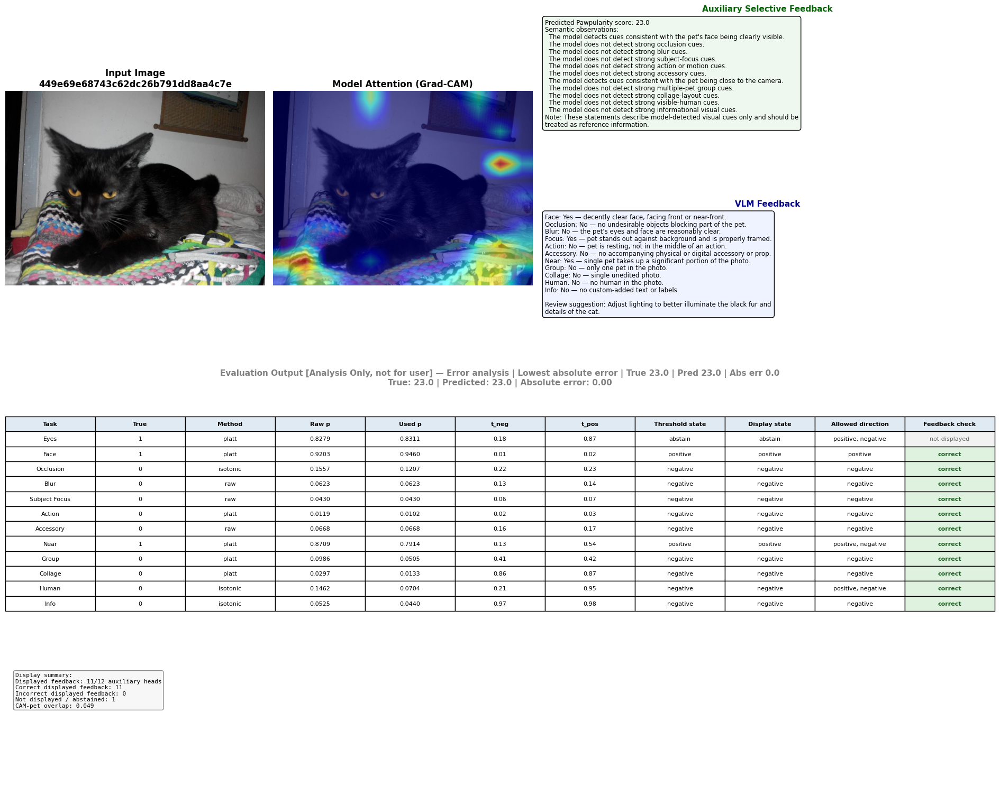

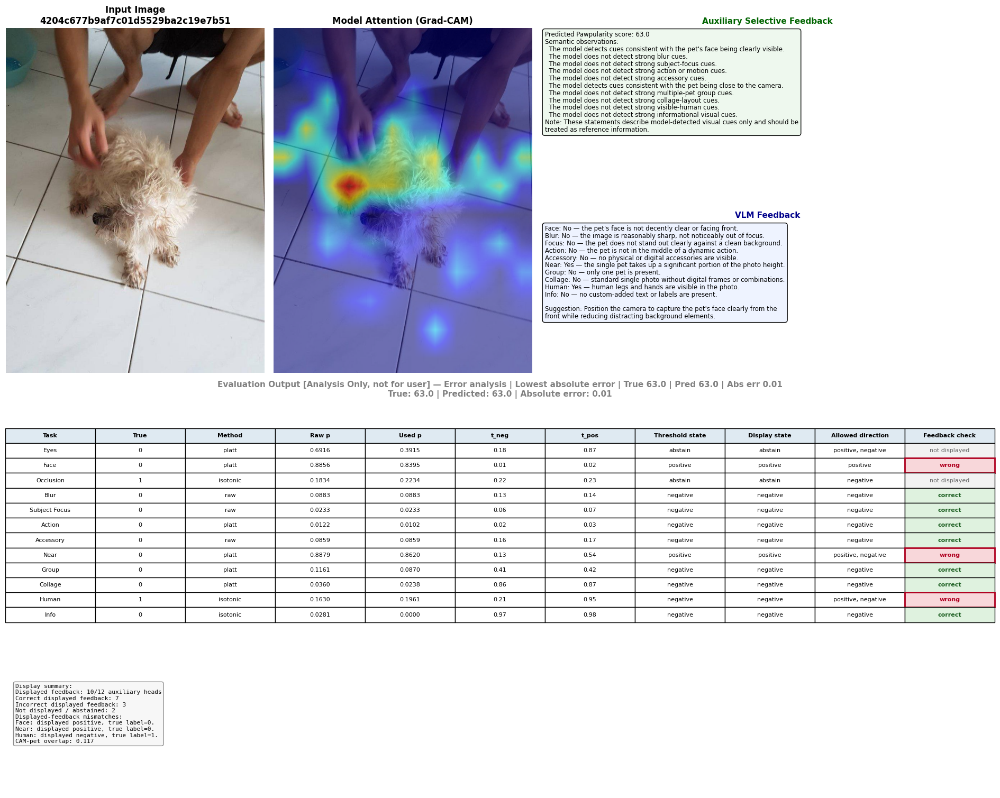

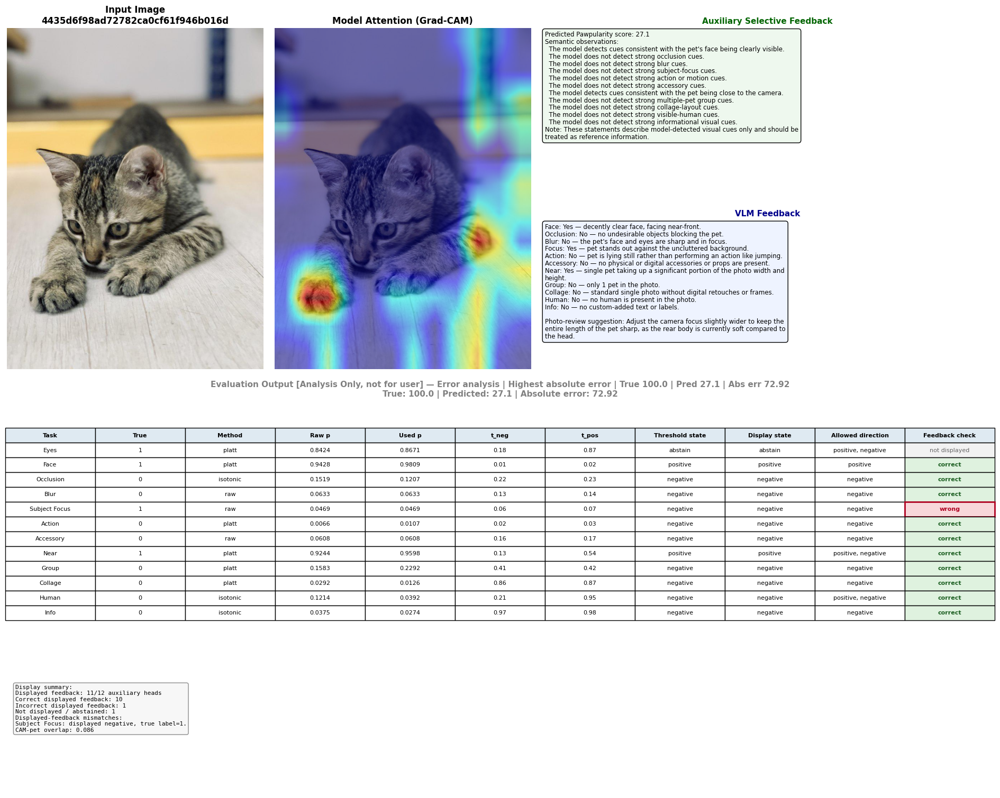

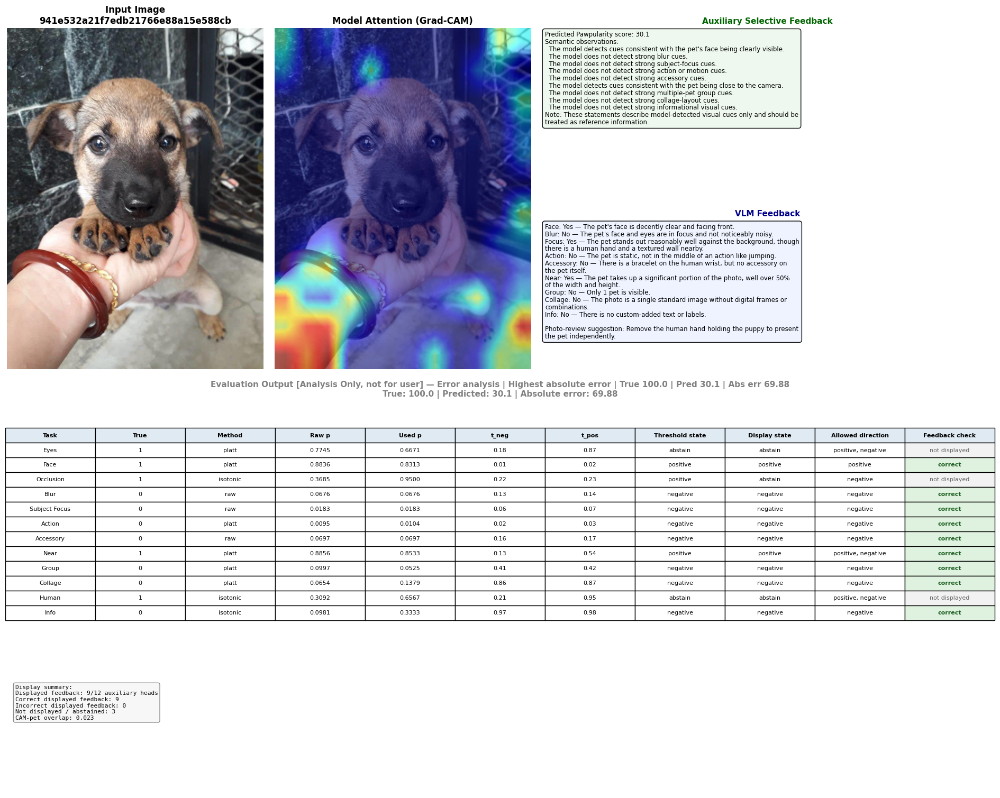

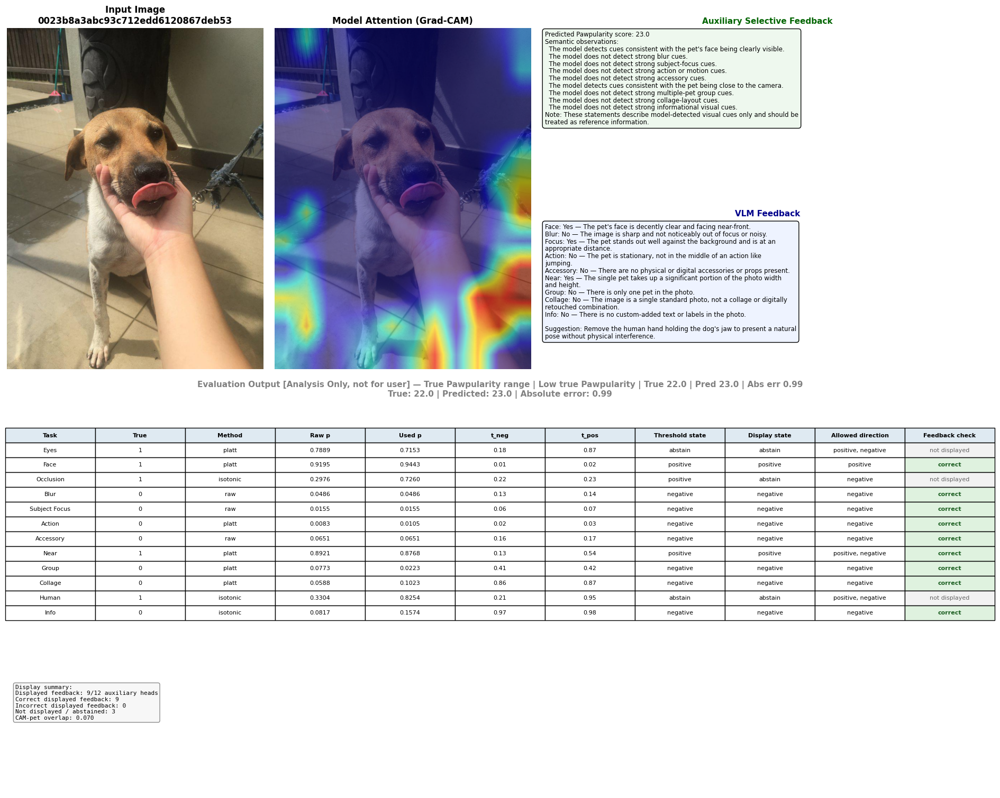

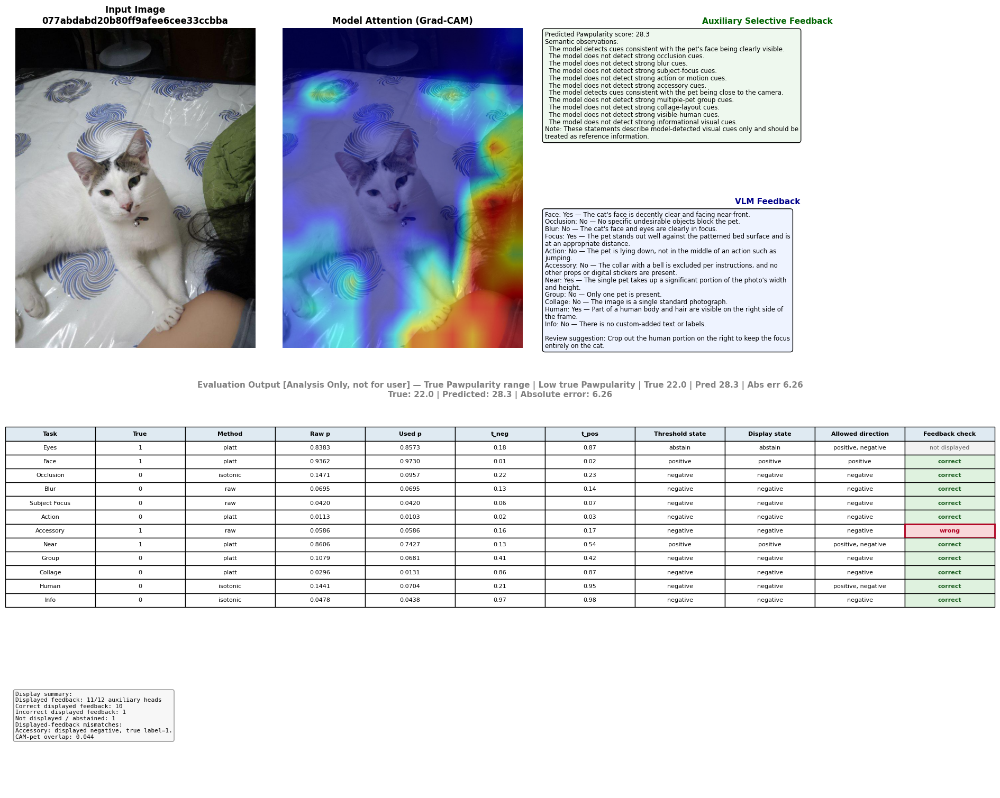

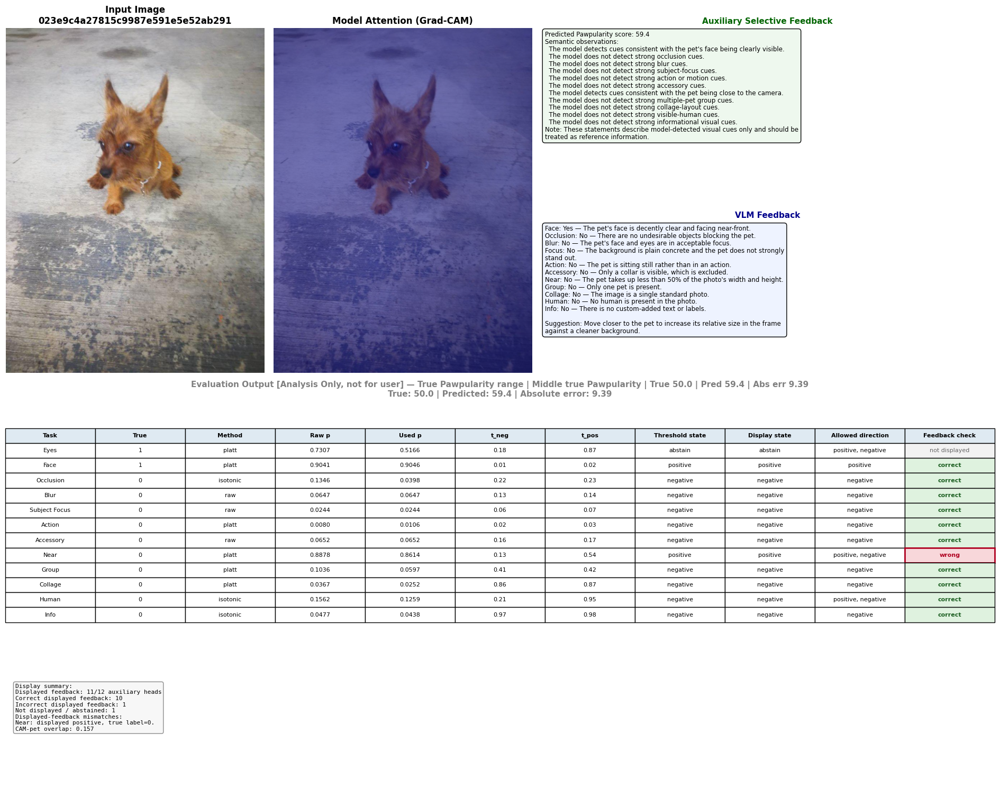

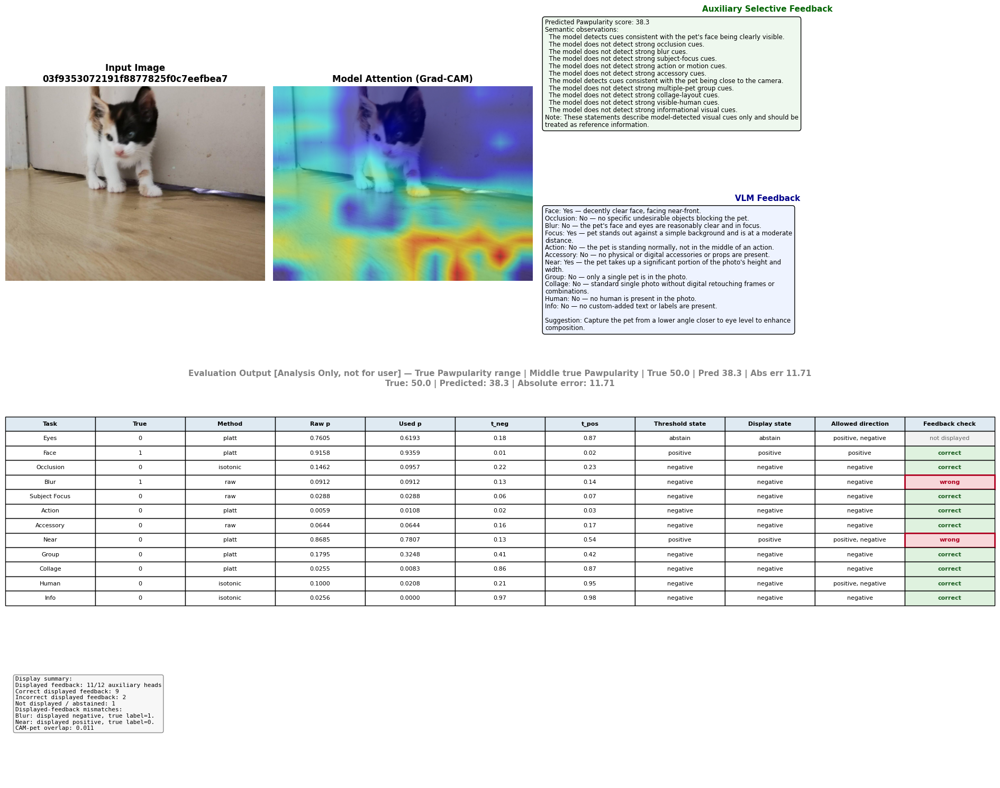

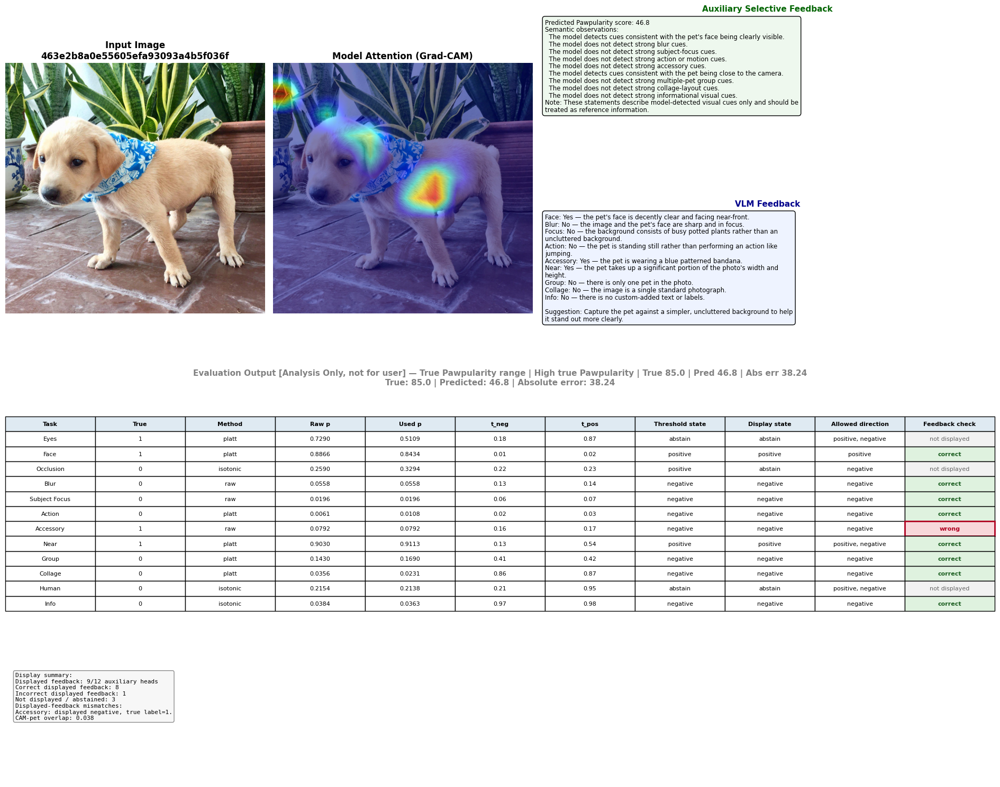

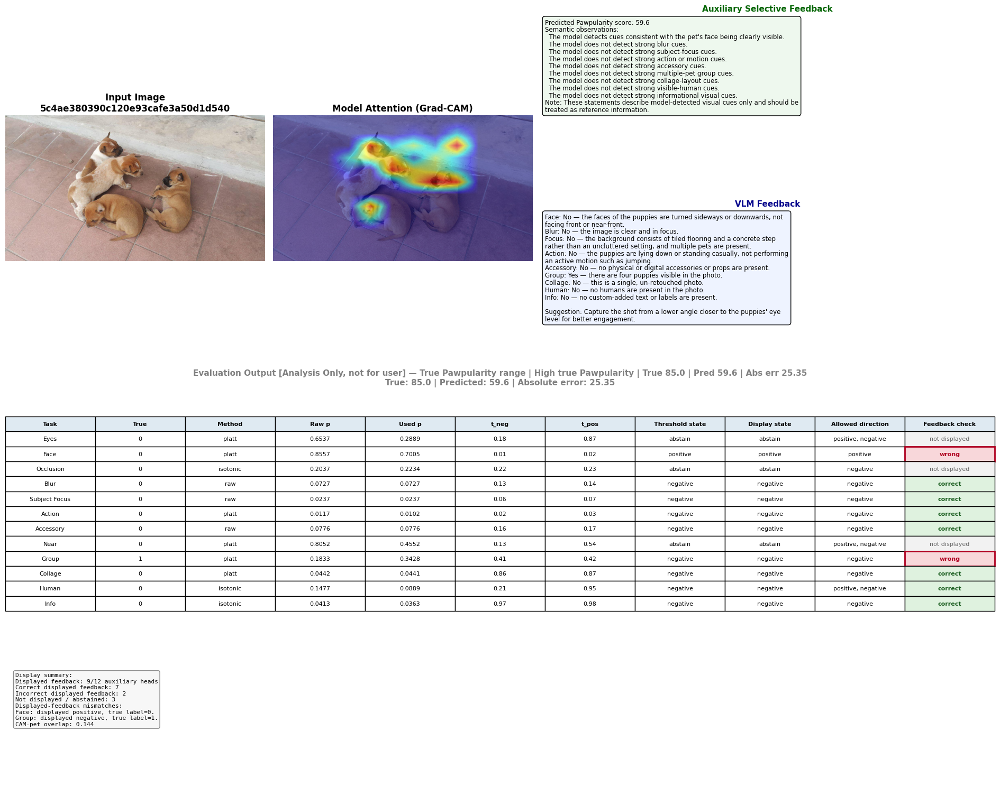

,Id,fold,true_paw,pred_paw,cam_pet_overlap,vlm_feedback,eyes_true,eyes_raw_probability,eyes_calibrated_probability,eyes_threshold_state,...,human_prototype_state,human_prob,human_pred,info_true,info_raw_probability,info_calibrated_probability,info_threshold_state,info_prototype_state,info_prob,info_pred
0,449e69e68743c62dc26b791dd8aa4c7e,4,23,23.000641,0.049021,"Face: Yes — decently clear face, facing front ...",1,0.827883,0.831131,abstain,...,negative,0.070352,0.0,0,0.052492,0.043974,negative,negative,0.043974,0
1,4204c677b9af7c01d5529ba2c19e7b51,5,63,62.992924,0.116938,Face: No — the pet's face is not decently clea...,0,0.691631,0.391483,abstain,...,negative,0.196078,0.0,0,0.028100,0.000000,negative,negative,0.000000,0
2,4435d6f98ad72782ca0cf61f946b016d,5,100,27.077641,0.086371,"Face: Yes — decently clear face, facing near-f...",1,0.842420,0.867084,abstain,...,negative,0.039179,0.0,0,0.037473,0.027397,negative,negative,0.027397,0
3,941e532a21f7edb21766e88a15e588cb,4,100,30.122242,0.023294,Face: Yes — The pet's face is decently clear a...,1,0.774489,0.667136,abstain,...,abstain,0.656716,NaN,0,0.098108,0.333333,negative,negative,0.333333,0
4,0023b8a3abc93c712edd6120867deb53,4,22,22.994572,0.070010,Face: Yes — The pet's face is decently clear a...,1,0.788930,0.715252,abstain,...,abstain,0.825397,NaN,0,0.081737,0.157407,negative,negative,0.157407,0
5,077abdabd20b80ff9afee6cee33ccbba,4,22,28.262936,0.044073,Face: Yes — The cat's face is decently clear a...,1,0.838256,0.857253,abstain,...,negative,0.070352,0.0,0,0.047840,0.043779,negative,negative,0.043779,0
6,023e9c4a27815c9987e591e5e52ab291,4,50,59.389870,0.157221,Face: Yes — The pet's face is decently clear a...,1,0.730670,0.516583,abstain,...,negative,0.125874,0.0,0,0.047738,0.043779,negative,negative,0.043779,0
7,03f9353072191f8877825f0c7eefbea7,5,50,38.291115,0.011054,"Face: Yes — decently clear face, facing near-f...",0,0.760540,0.619333,abstain,...,negative,0.020833,0.0,0,0.025561,0.000000,negative,negative,0.000000,0
8,463e2b8a0e55605efa93093a4b5f036f,5,85,46.759365,0.037675,Face: Yes — the pet's face is decently clear a...,1,0.728992,0.510915,abstain,...,abstain,0.213766,NaN,0,0.038421,0.036279,negative,negative,0.036279,0
9,5c4ae380390c120e93cafe3a50d1d540,5,85,59.646835,0.144449,Face: No — the faces of the puppies are turned...,0,0.653712,0.288896,abstain,...,negative,0.088889,0.0,0,0.041298,0.036279,negative,negative,0.036279,0


In [60]:
# ===================== part 29C ====================================
# SECTION 6 — STEP 6C-3
# Researcher-facing visual preview with auxiliary feedback, Grad-CAM, and VLM feedback
# ================================================================

from src.inference_feedback import get_gradcam, detect_pet_bbox, get_cam_overlap
import matplotlib.pyplot as plt
import textwrap

CHECK_SWIN_GRID = (7, 7)


def _get_vlm_feedback_for_image(img_id, vlm_feedback_df):
    match = vlm_feedback_df[vlm_feedback_df["Id"] == img_id]
    if len(match) == 0:
        return "VLM feedback is not available for this image."
    return str(match.iloc[0]["vlm_feedback"])


def _wrap_panel_text(text, width=82):
    wrapped_lines = []
    for line in str(text).splitlines():
        if not line.strip():
            wrapped_lines.append("")
        else:
            wrapped_lines.extend(textwrap.wrap(line, width=width))
    return "\n".join(wrapped_lines)


def visualise_analysis_with_vlm(
    img_id,
    img_folder,
    cfg,
    models_by_fold,
    image_fold_by_id,
    aux_tasks,
    device,
    swin_grid,
    predict_aux_selective,
    true_paw_dict,
    true_aux_dict,
    vlm_feedback_df,
    label="",
    use_yolo=True,
):
    path = os.path.join(img_folder, img_id + ".jpg")
    if not os.path.exists(path):
        raise FileNotFoundError(path)

    fold = int(image_fold_by_id[img_id])
    models = [models_by_fold[fold]]

    img_tensor, img_pil = preprocess(path, cfg)

    paw = predict_pawpularity(
        img_tensor=img_tensor,
        allFolds_models=models,
        device=device,
        fold=0,
    )

    aux_results = predict_aux_selective(
        img_tensor=img_tensor,
        allFolds_models=models,
        cfg=cfg,
        aux_tasks=aux_tasks,
        device=device,
        heldout_fold=fold,
    )

    _validate(aux_results, aux_tasks)

    _, cam_rsz, cam_ov = get_gradcam(
        img_tensor,
        img_pil,
        models,
        device,
        swin_grid,
    )

    overlap = None
    if use_yolo:
        bbox = detect_pet_bbox(path)
        if bbox is not None:
            overlap = get_cam_overlap(cam_rsz, bbox, img_pil)

    true_paw = (true_paw_dict or {}).get(img_id)
    true_aux = (true_aux_dict or {}).get(img_id, {})

    user_fb = generate_feedback_user(
        paw,
        aux_results,
        aux_tasks,
        overlap,
    )

    eval_out = generate_output_evaluation(
        paw,
        aux_results,
        aux_tasks,
        true_paw,
        true_aux,
        overlap,
    )

    vlm_feedback = _get_vlm_feedback_for_image(img_id, vlm_feedback_df)

    fig = plt.figure(figsize=(19, 15))
    grid = fig.add_gridspec(
        3,
        3,
        height_ratios=[1.35, 0.95, 0.45],
        width_ratios=[1.0, 1.0, 1.75],
    )

    image_ax = fig.add_subplot(grid[0, 0])
    image_ax.imshow(img_pil)
    image_ax.axis("off")
    image_ax.set_title(f"Input Image\n{img_id}", fontweight="bold")

    cam_ax = fig.add_subplot(grid[0, 1])
    cam_ax.imshow(cam_ov)
    cam_ax.axis("off")
    cam_ax.set_title("Model Attention (Grad-CAM)", fontweight="bold")

    feedback_grid = grid[0, 2].subgridspec(
        2,
        1,
        height_ratios=[1.05, 0.95],
        hspace=0.18,
    )

    aux_feedback_ax = fig.add_subplot(feedback_grid[0, 0])
    vlm_feedback_ax = fig.add_subplot(feedback_grid[1, 0])

    aux_feedback_ax.axis("off")
    vlm_feedback_ax.axis("off")

    aux_feedback_ax.set_title(
        "Auxiliary Selective Feedback",
        fontsize=11,
        fontweight="bold",
        color="darkgreen",
    )

    vlm_feedback_ax.set_title(
        "VLM Feedback",
        fontsize=11,
        fontweight="bold",
        color="darkblue",
    )

    aux_text = "\n".join(user_fb)

    aux_feedback_ax.text(
        0.01,
        0.98,
        _wrap_panel_text(aux_text, width=78),
        transform=aux_feedback_ax.transAxes,
        va="top",
        fontsize=8.5,
        linespacing=1.08,
        bbox=dict(boxstyle="round,pad=0.4", facecolor="#eef8ee", edgecolor="black"),
    )

    vlm_feedback_ax.text(
        0.01,
        0.98,
        _wrap_panel_text(str(vlm_feedback), width=78),
        transform=vlm_feedback_ax.transAxes,
        va="top",
        fontsize=8.5,
        linespacing=1.08,
        bbox=dict(boxstyle="round,pad=0.4", facecolor="#eef3ff", edgecolor="black"),
    )

    table_ax = fig.add_subplot(grid[1, :])
    table_ax.axis("off")

    title = "Evaluation Output [Analysis Only, not for user]"
    if label:
        title += f" — {label}"

    table_ax.set_title(
        f"{title}\n{eval_out['score_text']}",
        fontsize=11,
        fontweight="bold",
        color="gray",
        pad=10,
    )

    columns = [
        "Task",
        "True",
        "Method",
        "Raw p",
        "Used p",
        "t_neg",
        "t_pos",
        "Threshold state",
        "Display state",
        "Allowed direction",
        "Feedback check",
    ]

    table = table_ax.table(
        cellText=eval_out["rows"],
        colLabels=columns,
        loc="center",
        cellLoc="center",
    )

    table.auto_set_font_size(False)
    table.set_fontsize(8)
    table.scale(1.0, 1.3)

    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_text_props(weight="bold")
            cell.set_facecolor("#dfeaf2")

    feedback_check_col = columns.index("Feedback check")

    for (row, col), cell in table.get_celld().items():
        if row == 0 or col != feedback_check_col:
            continue

        value = cell.get_text().get_text().strip().lower()

        if value == "wrong":
            cell.set_facecolor("#f8d7da")
            cell.set_edgecolor("#b00020")
            cell.set_linewidth(2.0)
            cell.set_text_props(color="#b00020", weight="bold")

        elif value == "correct":
            cell.set_facecolor("#dff2df")
            cell.set_text_props(color="#1b5e20", weight="bold")

        elif value == "not displayed":
            cell.set_facecolor("#f2f2f2")
            cell.set_text_props(color="#666666")

    summary_ax = fig.add_subplot(grid[2, :])
    summary_ax.axis("off")

    summary_lines = ["Display summary:"]

    if eval_out.get("summary"):
        summary_lines.extend(eval_out["summary"])

    if eval_out.get("reasons"):
        summary_lines.append("Displayed-feedback mismatches:")
        summary_lines.extend(eval_out["reasons"])

    if eval_out.get("overlap") is not None:
        summary_lines.append(f"CAM-pet overlap: {eval_out['overlap']:.3f}")

    summary_ax.text(
        0.01,
        0.95,
        "\n".join(summary_lines),
        transform=summary_ax.transAxes,
        va="top",
        fontsize=8,
        family="monospace",
        bbox=dict(
            boxstyle="round,pad=0.3",
            facecolor="#f7f7f7",
            edgecolor="gray",
            alpha=0.9,
        ),
    )

    plt.tight_layout()
    plt.show()
    plt.close(fig)

    row = {
        "Id": img_id,
        "fold": fold,
        "true_paw": true_paw,
        "pred_paw": paw,
        "cam_pet_overlap": overlap,
        "vlm_feedback": vlm_feedback,
    }

    for task in aux_tasks:
        r = aux_results[task]
        prefix = task.lower()

        row[f"{prefix}_true"] = true_aux.get(task)

        for field, value in r.items():
            row[f"{prefix}_{field}"] = value

        row[f"{prefix}_prob"] = r["calibrated_probability"]
        row[f"{prefix}_pred"] = {
            "positive": 1,
            "negative": 0,
            "abstain": None,
        }[r["prototype_state"]]

    return row


case_labels = dict(zip(selected_cases_df["Id"], selected_cases_df["case_label"]))

case_batch_rows = []

for img_id in selected_cases_df["Id"].tolist():
    row = visualise_analysis_with_vlm(
        img_id=img_id,
        img_folder=IMG_FOLDER,
        cfg=ACTIVE_CFG,
        models_by_fold=models_by_fold,
        image_fold_by_id=image_fold_by_id,
        aux_tasks=CALIBRATION_TASKS,
        device=device,
        swin_grid=CHECK_SWIN_GRID,
        predict_aux_selective=predict_aux_selective,
        true_paw_dict=true_paw_dict,
        true_aux_dict=true_aux_dict,
        vlm_feedback_df=vlm_feedback_df,
        label=case_labels.get(img_id, ""),
        use_yolo=True,
    )

    case_batch_rows.append(row)

case_batch_results = pd.DataFrame(case_batch_rows)

display(case_batch_results)

In [61]:
# ===================== part 30 ====================================
# SECTION 6 — STEP 6D
# Build and save user-evaluation materials
# ================================================================

from src.user_evaluation import (
    build_condition_materials,
    build_counterbalanced_versions,
    build_questionnaire_items,
    build_survey_export,
    build_design_summary,
    get_design_note,
    get_methods_text,
    save_user_eval_outputs,
    check_user_eval_outputs,
)

VLM_FEEDBACK_PATH = os.path.join(
    ACTIVE_DIR,
    "vlm_feedback_completed.csv",
)

vlm_feedback_df = pd.read_csv(
    VLM_FEEDBACK_PATH
)

condition_materials_df = build_condition_materials(
    user_eval_images_df=user_eval_images_df,
    vlm_feedback_df=vlm_feedback_df,
    img_folder=IMG_FOLDER,
)

CONDITION_ORDER = ["A", "B", "C", "D"]

user_eval_versions_df = build_counterbalanced_versions(
    user_eval_images_df=user_eval_images_df,
    condition_materials_df=condition_materials_df,
    condition_order=CONDITION_ORDER,
)

questionnaire_df = build_questionnaire_items()

survey_export_df = build_survey_export(
    user_eval_versions_df=user_eval_versions_df,
    questionnaire_df=questionnaire_df,
)

user_eval_design_summary_df = build_design_summary(
    user_eval_images_df=user_eval_images_df,
    user_eval_versions_df=user_eval_versions_df,
    condition_order=CONDITION_ORDER,
    vlm_model=VLM_MODEL,
)

user_eval_design_note = get_design_note()
vlm_user_eval_methods_text = get_methods_text()

saved_paths = save_user_eval_outputs(
    active_dir=ACTIVE_DIR,
    condition_materials_df=condition_materials_df,
    user_eval_versions_df=user_eval_versions_df,
    questionnaire_df=questionnaire_df,
    survey_export_df=survey_export_df,
    design_summary_df=user_eval_design_summary_df,
    design_note=user_eval_design_note,
    methods_text=vlm_user_eval_methods_text,
)

print("Saved user-evaluation files:")
for name, path in saved_paths.items():
    print(name, ":", path)

Saved user-evaluation files:
condition_materials : ../../outputs/extra/exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion/user_eval_condition_materials.csv
counterbalanced_versions : ../../outputs/extra/exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion/user_eval_counterbalanced_versions.csv
questionnaire : ../../outputs/extra/exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion/user_eval_questionnaire_items.csv
survey_export : ../../outputs/extra/exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion/user_eval_survey_export.csv
design_summary : ../../outputs/extra/exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion/user_eval_design_summary.csv
design_note : ../../outputs/extra/exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion/user_eval_design_note.txt
methods_text : ../../outputs/extra/exp19_swin_384_strong_MSELoss_All12_Aux_StrongHead_fixDupOcclusion/vlm_user_eval_methods_text.txt


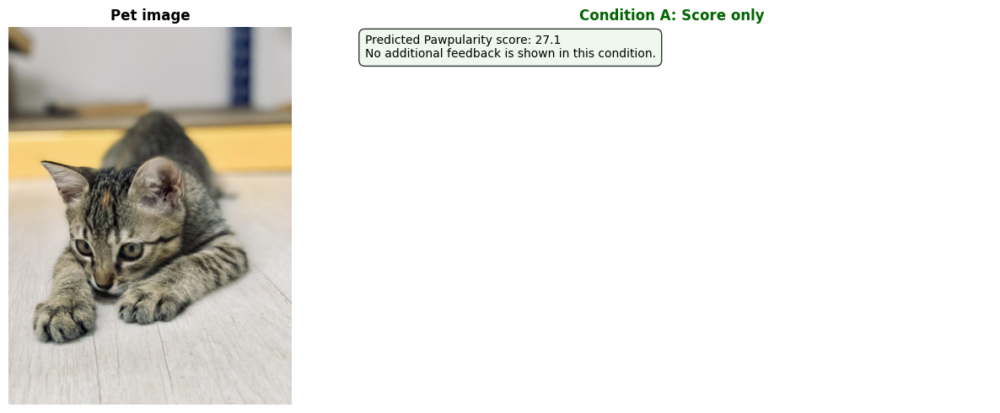

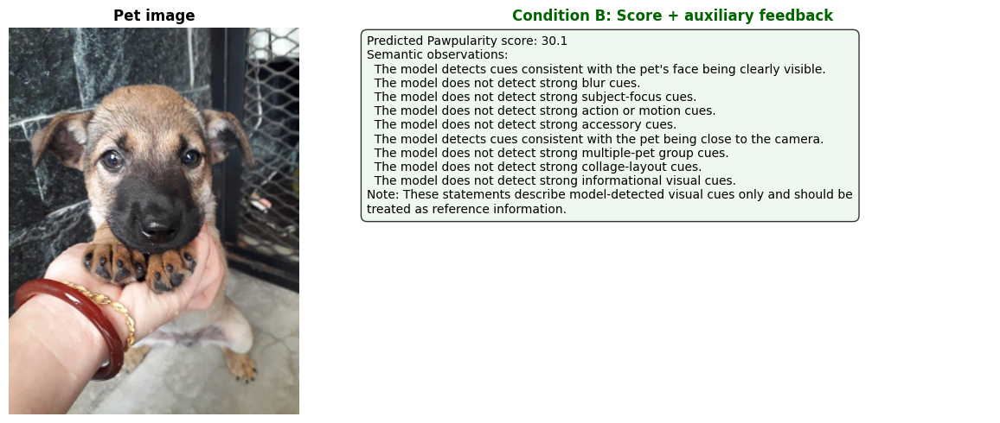

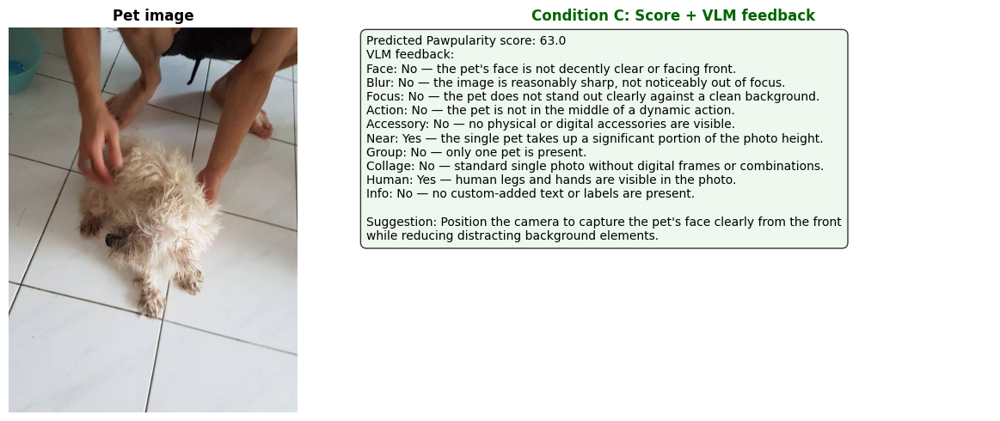

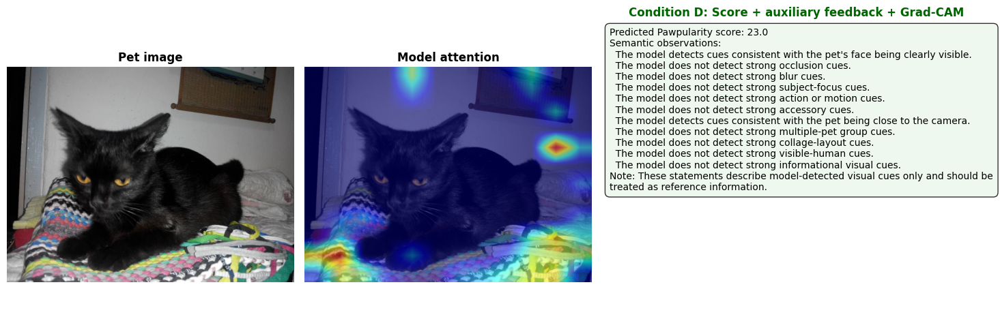

In [62]:
# ===================== part 30B ====================================
# SECTION 6 — STEP 6J
# Visual preview of user-evaluation conditions
#
# This is a user-facing preview.
# It does NOT show true labels, threshold tables, correctness checks,
# or researcher-only diagnostics.
# ================================================================

import matplotlib.pyplot as plt
from PIL import Image
import textwrap


def _wrap_lines(text, width=85):
    wrapped = []

    for line in str(text).splitlines():
        if not line.strip():
            wrapped.append("")
        else:
            wrapped.extend(textwrap.wrap(line, width=width))

    return "\n".join(wrapped)


def _aux_feedback_for_image(img_id, paw_score, batch_results_df, aux_tasks):
    row = batch_results_df[batch_results_df["Id"] == img_id].iloc[0]

    aux_results = {}

    for task in aux_tasks:
        prefix = task.lower()

        aux_results[task] = {
            "raw_probability": row[f"{prefix}_raw_probability"],
            "calibrated_probability": row[f"{prefix}_calibrated_probability"],
            "threshold_state": row[f"{prefix}_threshold_state"],
            "prototype_state": row[f"{prefix}_prototype_state"],
        }

    return generate_feedback_user(
        paw_score=paw_score,
        aux_results=aux_results,
        aux_tasks=aux_tasks,
    )


def _get_gradcam_overlay_for_image(img_id):
    fold = int(image_fold_by_id[img_id])
    models = [models_by_fold[fold]]

    image_path = os.path.join(IMG_FOLDER, img_id + ".jpg")
    img_tensor, img_pil = preprocess(image_path, ACTIVE_CFG)

    _, _, cam_ov = get_gradcam(
        img_tensor,
        img_pil,
        models,
        device,
        CHECK_SWIN_GRID,
    )

    return cam_ov


def preview_user_eval_condition(
    survey_export_df,
    batch_results_df,
    condition,
    row_index=0,
    aux_tasks=CALIBRATION_TASKS,
):
    condition_rows = (
        survey_export_df[survey_export_df["condition"] == condition]
        .reset_index(drop=True)
    )

    row = condition_rows.iloc[row_index]

    img_id = row["Id"]
    image_path = row["image_path"]
    paw_score = float(row["pred_paw"])

    image = Image.open(image_path).convert("RGB")

    feedback_lines = [
        f"Predicted Pawpularity score: {paw_score:.1f}"
    ]

    if bool(row["show_aux_feedback"]):
        aux_lines = _aux_feedback_for_image(
            img_id=img_id,
            paw_score=paw_score,
            batch_results_df=batch_results_df,
            aux_tasks=aux_tasks,
        )
        feedback_lines.extend(aux_lines[1:])

    if bool(row["show_vlm_feedback"]):
        feedback_lines.append("VLM feedback:")
        feedback_lines.append(row["vlm_feedback"])

    if not bool(row["show_aux_feedback"]) and not bool(row["show_vlm_feedback"]):
        feedback_lines.append("No additional feedback is shown in this condition.")

    feedback_text = _wrap_lines(
        "\n".join(feedback_lines),
        width=80,
    )

    show_gradcam = bool(row["show_gradcam"])

    if show_gradcam:
        fig, axes = plt.subplots(
            1,
            3,
            figsize=(16, 5),
            gridspec_kw={"width_ratios": [1.0, 1.0, 1.35]},
        )
    else:
        fig, axes = plt.subplots(
            1,
            2,
            figsize=(13, 5),
            gridspec_kw={"width_ratios": [1.0, 1.4]},
        )

    axes[0].imshow(image)
    axes[0].axis("off")
    axes[0].set_title("Pet image", fontweight="bold")

    if show_gradcam:
        cam_ov = _get_gradcam_overlay_for_image(img_id)

        axes[1].imshow(cam_ov)
        axes[1].axis("off")
        axes[1].set_title("Model attention", fontweight="bold")

        text_ax = axes[2]

    else:
        text_ax = axes[1]

    text_ax.axis("off")
    text_ax.set_title(
        f"Condition {condition}: {row['condition_name']}",
        fontweight="bold",
        color="darkgreen",
    )

    text_ax.text(
        0.02,
        0.98,
        feedback_text,
        transform=text_ax.transAxes,
        va="top",
        fontsize=10,
        bbox=dict(
            boxstyle="round,pad=0.5",
            facecolor="#eef8ee",
            edgecolor="#333333",
        ),
    )

    plt.tight_layout()
    plt.show()


for condition in CONDITION_ORDER:
    preview_user_eval_condition(
        survey_export_df=survey_export_df,
        batch_results_df=case_batch_results,
        condition=condition,
        row_index=0,
        aux_tasks=CALIBRATION_TASKS,
    )

Previewing all conditions for image:
4435d6f98ad72782ca0cf61f946b016d


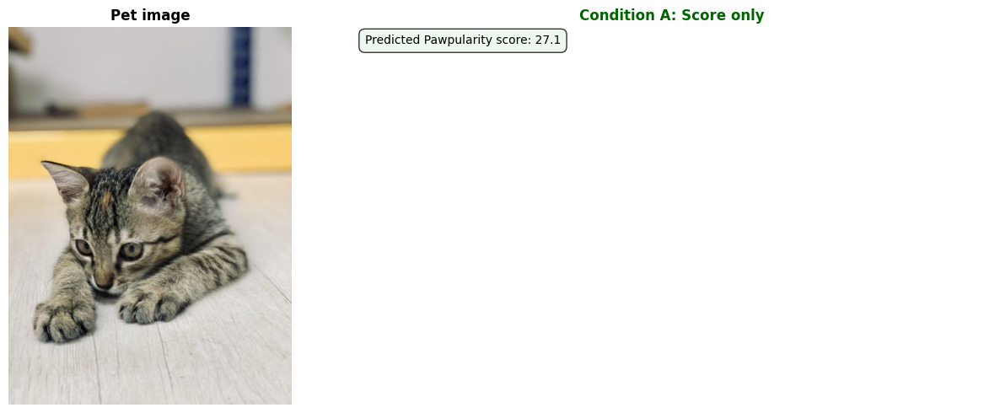

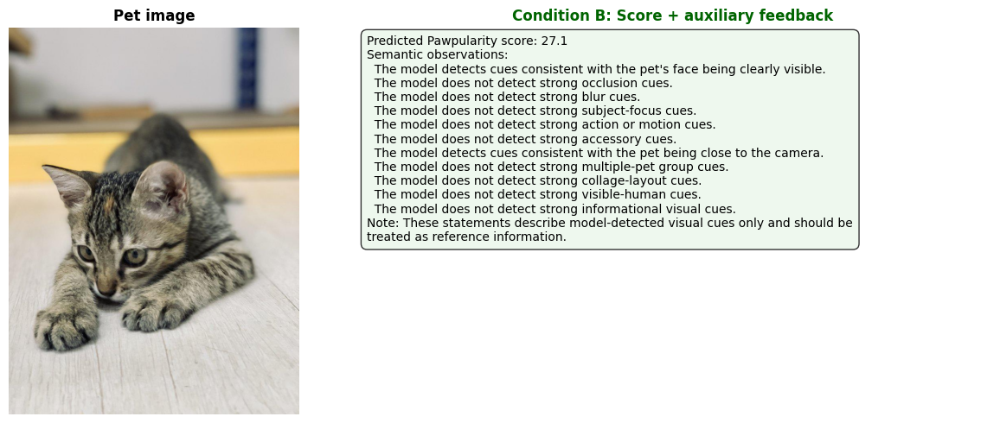

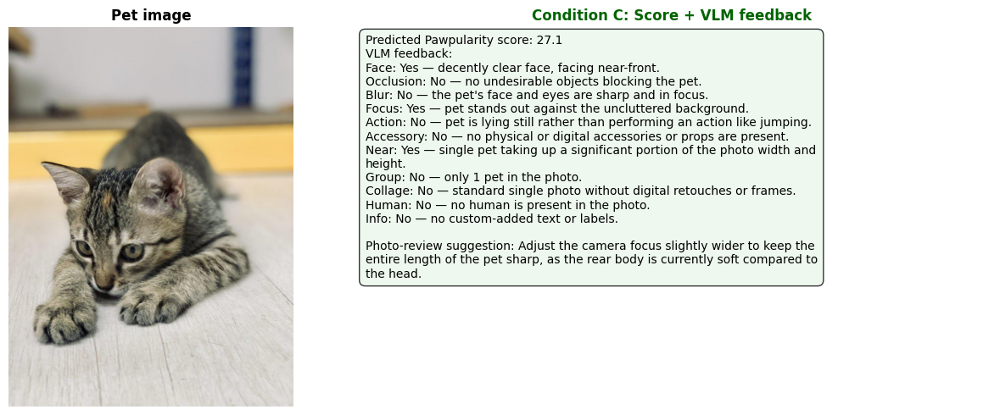

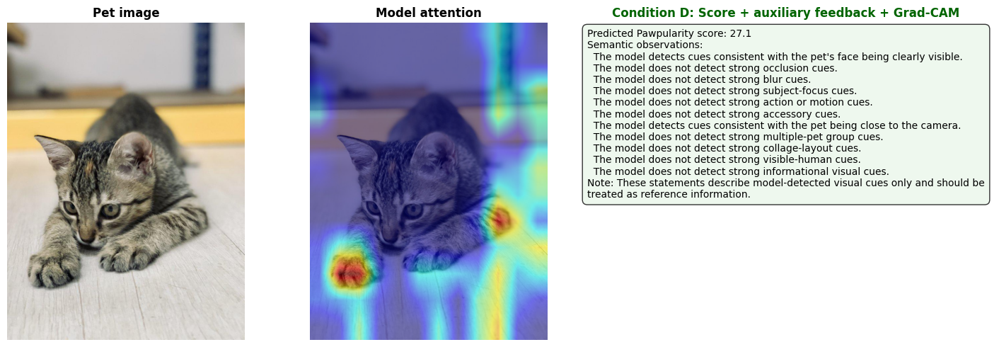

In [63]:
# ===================== part 30C ====================================
# SECTION 6 — STEP 6J-2
# Visual preview of all user-evaluation conditions for one image
#
# This helps compare A/B/C/D using the same image.
# ================================================================

def preview_all_conditions_for_one_image(
    survey_export_df,
    batch_results_df,
    img_id=None,
    row_index=0,
    aux_tasks=CALIBRATION_TASKS,
):
    if img_id is None:
        img_id = (
            survey_export_df["Id"]
            .drop_duplicates()
            .iloc[row_index]
        )

    print("Previewing all conditions for image:")
    print(img_id)

    for condition in CONDITION_ORDER:

        condition_rows = (
            survey_export_df[
                (survey_export_df["condition"] == condition)
                & (survey_export_df["Id"] == img_id)
            ]
            .reset_index(drop=True)
        )

        if len(condition_rows) == 0:
            print(
                f"Condition {condition} not found for image {img_id}."
            )
            continue

        row = condition_rows.iloc[0]

        image = Image.open(
            row["image_path"]
        ).convert("RGB")

        paw_score = float(
            row["pred_paw"]
        )

        feedback_lines = [
            f"Predicted Pawpularity score: {paw_score:.1f}"
        ]

        if bool(row["show_aux_feedback"]):
            aux_lines = _aux_feedback_for_image(
                img_id=img_id,
                paw_score=paw_score,
                batch_results_df=batch_results_df,
                aux_tasks=aux_tasks,
            )

            feedback_lines.extend(
                aux_lines[1:]
            )

        if bool(row["show_vlm_feedback"]):
            feedback_lines.append(
                "VLM feedback:"
            )
            feedback_lines.append(
                row["vlm_feedback"]
            )

        feedback_text = _wrap_lines(
            "\n".join(feedback_lines),
            width=80,
        )

        show_gradcam = bool(
            row["show_gradcam"]
        )

        if show_gradcam:
            fig, axes = plt.subplots(
                1,
                3,
                figsize=(16, 5),
                gridspec_kw={
                    "width_ratios": [1.0, 1.0, 1.35],
                },
            )

        else:
            fig, axes = plt.subplots(
                1,
                2,
                figsize=(13, 5),
                gridspec_kw={
                    "width_ratios": [1.0, 1.4],
                },
            )

        axes[0].imshow(
            image
        )
        axes[0].axis("off")
        axes[0].set_title(
            "Pet image",
            fontweight="bold",
        )

        if show_gradcam:
            cam_ov = _get_gradcam_overlay_for_image(
                img_id
            )

            axes[1].imshow(
                cam_ov
            )
            axes[1].axis("off")
            axes[1].set_title(
                "Model attention",
                fontweight="bold",
            )

            text_ax = axes[2]

        else:
            text_ax = axes[1]

        text_ax.axis("off")
        text_ax.set_title(
            f"Condition {condition}: {row['condition_name']}",
            fontweight="bold",
            color="darkgreen",
        )

        text_ax.text(
            0.02,
            0.98,
            feedback_text,
            transform=text_ax.transAxes,
            va="top",
            fontsize=10,
            bbox=dict(
                boxstyle="round,pad=0.5",
                facecolor="#eef8ee",
                edgecolor="#333333",
            ),
        )

        plt.tight_layout()
        plt.show()


# Example 1: preview all conditions for the first image
preview_all_conditions_for_one_image(
    survey_export_df=survey_export_df,
    batch_results_df=case_batch_results,
    row_index=0,
    aux_tasks=CALIBRATION_TASKS,
)

# Example 2: preview all conditions for a specific image
# preview_all_conditions_for_one_image(
#     survey_export_df=survey_export_df,
#     batch_results_df=case_batch_results,
#     img_id="0023b8a3abc93c712edd6120867deb53",
#     aux_tasks=CALIBRATION_TASKS,
# )

In [64]:
# ===================== part 31 ====================================
# SECTION 6 — STEP 6E
# Final user-evaluation material sanity check
# ================================================================

output_sanity_df = check_user_eval_outputs(
    active_dir=ACTIVE_DIR,
)

display(output_sanity_df)

assert output_sanity_df["exists"].all(), (
    "Some expected output files are missing."
)

assert len(vlm_feedback_df) == user_eval_images_df["Id"].nunique()
assert len(condition_materials_df) == user_eval_images_df["Id"].nunique() * 4
assert len(user_eval_versions_df) == user_eval_images_df["Id"].nunique() * 4
assert len(survey_export_df) == user_eval_images_df["Id"].nunique() * 4

print("All user-evaluation material checks passed.")

,output,path,exists
0,VLM feedback,../../outputs/extra/exp19_swin_384_strong_MSEL...,True
1,Condition materials,../../outputs/extra/exp19_swin_384_strong_MSEL...,True
2,Counterbalanced versions,../../outputs/extra/exp19_swin_384_strong_MSEL...,True
3,Questionnaire items,../../outputs/extra/exp19_swin_384_strong_MSEL...,True
4,Survey export,../../outputs/extra/exp19_swin_384_strong_MSEL...,True
5,Design summary,../../outputs/extra/exp19_swin_384_strong_MSEL...,True
6,Design note,../../outputs/extra/exp19_swin_384_strong_MSEL...,True
7,Methods text,../../outputs/extra/exp19_swin_384_strong_MSEL...,True


All user-evaluation material checks passed.


In [65]:
# ===================== part 32 ====================================
# SECTION 6 — STEP 6F
# Inspect final user-evaluation image set
# ================================================================

print("Final user-evaluation image set:")
print("Number of images:", user_eval_images_df["Id"].nunique())

display(
    user_eval_images_df[
        [
            "Id",
            "fold",
            "case_group",
            "case_type",
            "score_range",
            "true_paw",
            "pred_paw",
            "absolute_error",
        ]
    ].round(3)
)

print("\nImage composition by Pawpularity range:")
display(
    user_eval_images_df["score_range"]
    .value_counts()
    .rename_axis("score_range")
    .reset_index(name="n_images")
)

print("\nImage composition by case type:")
display(
    user_eval_images_df["case_type"]
    .value_counts()
    .rename_axis("case_type")
    .reset_index(name="n_images")
)

Final user-evaluation image set:
Number of images: 10


,Id,fold,case_group,case_type,score_range,true_paw,pred_paw,absolute_error
0,4435d6f98ad72782ca0cf61f946b016d,5,Error analysis,Highest absolute error,High,100.0,27.078,72.922
1,941e532a21f7edb21766e88a15e588cb,4,Error analysis,Highest absolute error,High,100.0,30.122,69.878
2,4204c677b9af7c01d5529ba2c19e7b51,5,Error analysis,Lowest absolute error,Middle,63.0,62.993,0.007
3,449e69e68743c62dc26b791dd8aa4c7e,4,Error analysis,Lowest absolute error,Low,23.0,23.001,0.001
4,463e2b8a0e55605efa93093a4b5f036f,5,True Pawpularity range,High true Pawpularity,High,85.0,46.759,38.241
5,5c4ae380390c120e93cafe3a50d1d540,5,True Pawpularity range,High true Pawpularity,High,85.0,59.647,25.353
6,0023b8a3abc93c712edd6120867deb53,4,True Pawpularity range,Low true Pawpularity,Low,22.0,22.995,0.995
7,077abdabd20b80ff9afee6cee33ccbba,4,True Pawpularity range,Low true Pawpularity,Low,22.0,28.263,6.263
8,023e9c4a27815c9987e591e5e52ab291,4,True Pawpularity range,Middle true Pawpularity,Middle,50.0,59.390,9.390
9,03f9353072191f8877825f0c7eefbea7,5,True Pawpularity range,Middle true Pawpularity,Middle,50.0,38.291,11.709



Image composition by Pawpularity range:


,score_range,n_images
0,High,4
1,Low,3
2,Middle,3



Image composition by case type:


,case_type,n_images
0,Highest absolute error,2
1,Lowest absolute error,2
2,High true Pawpularity,2
3,Low true Pawpularity,2
4,Middle true Pawpularity,2


In [66]:
# ===================== part 33 ====================================
# SECTION 6 — STEP 6G
# Inspect condition balance
# ================================================================

print("Condition counts per participant version:")

condition_balance_df = pd.crosstab(
    user_eval_versions_df["version"],
    user_eval_versions_df["condition"],
)

display(condition_balance_df)

print("\nImage count per participant version:")
display(
    user_eval_versions_df
    .groupby("version")["Id"]
    .nunique()
    .reset_index(name="n_images")
)

print("\nEach image should appear once per version:")
display(
    user_eval_versions_df
    .groupby(["version", "Id"])
    .size()
    .reset_index(name="n_times")
    .sort_values(["version", "Id"])
    .head()
)

assert (
    user_eval_versions_df
    .groupby(["version", "Id"])
    .size()
    .eq(1)
    .all()
)

print("Each image appears exactly once in each participant version.")

Condition counts per participant version:


condition,A,B,C,D
version,,,,
Version 1,3,3,2,2
Version 2,2,3,3,2
Version 3,2,2,3,3
Version 4,3,2,2,3



Image count per participant version:


,version,n_images
0,Version 1,10
1,Version 2,10
2,Version 3,10
3,Version 4,10



Each image should appear once per version:


,version,Id,n_times
0,Version 1,0023b8a3abc93c712edd6120867deb53,1
1,Version 1,023e9c4a27815c9987e591e5e52ab291,1
2,Version 1,03f9353072191f8877825f0c7eefbea7,1
3,Version 1,077abdabd20b80ff9afee6cee33ccbba,1
4,Version 1,4204c677b9af7c01d5529ba2c19e7b51,1


Each image appears exactly once in each participant version.


In [67]:
# ===================== part 34 ====================================
# SECTION 6 — STEP 6H
# Inspect VLM feedback text
# ================================================================

print("VLM feedback examples:")

for row in (
    vlm_feedback_df
    .sort_values("Id")
    .head(3)
    .itertuples(index=False)
):
    print("=" * 80)
    print("Image ID:", row.Id)
    print("Model:", row.vlm_model)
    print(row.vlm_feedback)

VLM feedback examples:
Image ID: 0023b8a3abc93c712edd6120867deb53
Model: models/gemini-flash-lite-latest
Face: Yes — The pet's face is decently clear and facing near-front.
Blur: No — The image is sharp and not noticeably out of focus or noisy.
Focus: Yes — The pet stands out well against the background and is at an appropriate distance.
Action: No — The pet is stationary, not in the middle of an action like jumping.
Accessory: No — There are no physical or digital accessories or props present.
Near: Yes — The single pet takes up a significant portion of the photo width and height.
Group: No — There is only one pet in the photo.
Collage: No — The image is a single standard photo, not a collage or digitally retouched combination.
Info: No — There is no custom-added text or labels in the photo.

Suggestion: Remove the human hand holding the dog's jaw to present a natural pose without physical interference.
Image ID: 023e9c4a27815c9987e591e5e52ab291
Model: models/gemini-flash-lite-latest


In [68]:
# ===================== part 35 ====================================
# SECTION 6 — STEP 6I
# Inspect survey export examples by condition
# ================================================================

for condition in CONDITION_ORDER:

    example_row = (
        survey_export_df[
            survey_export_df["condition"] == condition
        ]
        .iloc[0]
    )

    print("=" * 80)
    print("Condition:", condition)
    print("Condition name:", example_row["condition_name"])
    print("Image ID:", example_row["Id"])
    print("Predicted Pawpularity:", round(float(example_row["pred_paw"]), 1))
    print("\nDisplay instruction:")
    print(example_row["display_instruction"])

    if example_row["show_vlm_feedback"]:
        print("\nVLM feedback:")
        print(example_row["vlm_feedback"])

Condition: A
Condition name: Score only
Image ID: 4435d6f98ad72782ca0cf61f946b016d
Predicted Pawpularity: 27.1

Display instruction:
Predicted Pawpularity score: 27.1
Condition: B
Condition name: Score + auxiliary feedback
Image ID: 941e532a21f7edb21766e88a15e588cb
Predicted Pawpularity: 30.1

Display instruction:
Predicted Pawpularity score: 30.1
[Show task-specific auxiliary feedback generated by the prototype]
Condition: C
Condition name: Score + VLM feedback
Image ID: 4204c677b9af7c01d5529ba2c19e7b51
Predicted Pawpularity: 63.0

Display instruction:
Predicted Pawpularity score: 63.0
[Show VLM-generated feedback]

VLM feedback:
Face: No — the pet's face is not decently clear or facing front.
Blur: No — the image is reasonably sharp, not noticeably out of focus.
Focus: No — the pet does not stand out clearly against a clean background.
Action: No — the pet is not in the middle of a dynamic action.
Accessory: No — no physical or digital accessories are visible.
Near: Yes — the single 